### Step 0: Get packages and helper functions

In [1]:
# Add source and data file paths
import os
path = os.path.abspath(os.getcwd())
os.chdir("../..")
parent_path = os.path.abspath(os.getcwd())

import sys 
sys.path.insert(1, parent_path + '\\source')
sys.path.insert(2, parent_path + '\\data')

import numpy as np; import torch; import time

# Import source/helper functions
from misc_helper import combine_layers, get_dt, get_userPar, training_loop, make_gif
from plot_helper import reference_plot, sample_plot
from trainingData_helper import generate_trainData
from windowSweep_helper import window_sweep_class
from pde_helper import PDE_class
from neuralNetwork_helper import Net, activation_func_a, weight_class, dtPINN

## Step 1: Define PDE problem and visualize 

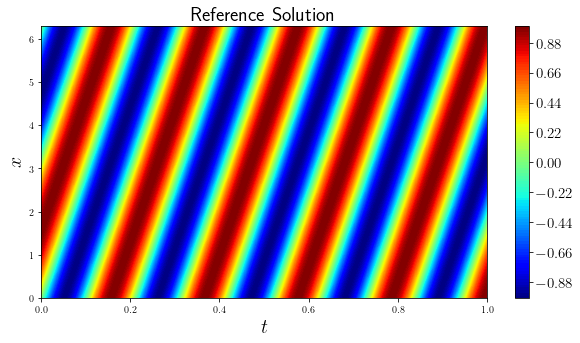

In [2]:
pde_type = 'convection'
newParams = {}

#pde_type = 'new'
#newParams = {}; newParams['data'] = parent_path+'\\data\\convec_10.mat'; newParams['pde'] = 'u_t + 10*u_x'; newParams['IC'] = 'np.sin(x)';

PDE = PDE_class(pde_type, newParams)
dataPar = PDE.data()

# Reference solution
reference_plot(dataPar)

## Step 2: dtPINN user settings

In [3]:
### Neural network parameters
input_encoding = 1 # Boolean for encode input to enforce exact boundary condtions
M = 1; L = get_dt(dataPar['xmin'], dataPar['xmax'], 1) # Hyperparameters for exact BC encoding, not used if turned off
hidden_layers = [50, 50, 50, 50]; layers = combine_layers(input_encoding, M, hidden_layers) # PINN layers
# Note Adam and L-BFGS epoch/iterations are per frame for generating animations, the total amount is multiplied by the training loops defined below
# Will be cutoff early if a new network is added since optimizer needs to be reset via this control loop
adam_params = [500, 0.001] # Optimization Hyperparameters for Adam [epochs, learning rate]
lbfgs_params = [0.1, 500, None, -1, -1, 50] # Optimization Hyperparameters for LBFGS [learning rate, max iterations, max evaluations, tolerance gradient, tolerance change, history size]
adaptive_activation = 0 # Adaptive activation functions in NN
dirichlet_bc = 0 # Use Dirichlet boundary condtions based on reference solution (0 = no, 1 = yes), number of points will depend on reference solution not user-defined N_b
learned_weights = 0 
lambda_w = 100 # Weight applied to non PDE-reisudal loss terms

### Training data parameters
N_x = 100; N_t = 100; N_f = N_x*N_t # Number of collocation points in the ENTIRE domian (pre subdomain partitioning)
N_0 = 200 # Number of initial condtion points in the ENTIRE domain
N_b = 200 # Number of boundary condtion points in the ENTIRE domain
N_i = N_0 # Number of interface continuity points for each interface (total = N_i*(n-1))
collocation_sampling = 'lhs' # Latin-hypercube or grid sampling

### From Algorithm 1 in paper
## 1. Choose stacked-decomposition parameters [n, dS, adaptive dt]
num_partitions = 1; dt = get_dt(dataPar['tmin'], dataPar['tmax'], num_partitions) # Number of time-slabs in domain (1 = PINN) and dt derived from number and t-domain; 
dS = 1 # Number of continuously training segments
causal_dS = 1 # Boolean for adding in intial dS segments causality or not (0 = no, 1 = yes)
stacked_tol = 1*10**(-7)

## 2. Choose interface conditions [residual continuity, Cp continuity, other]
interface_condition = ['u'] # List of interface condtions to add (u = solution continuity, uavg = average solution continuity, residual = minimize residuals, rc = minimize residual continuity)
# [xPINN = 'uavg' + 'rc', C^p continuity = 'u' for first-order systems]

## 3. Choose transfer learning parameters [number of layers, trainability of layers]
# If all layers that are transfered and kept learnable = 'fine-tuning'
# If some layers that are transfered and made unlearnable = 'transfer learning'
layer_transfer = [1, 1, 1, 1, 1] # Boolean mask to transfer weights and bias (length = len(layers) - 1)
layer_trainability = [1, 1, 1, 1, 1] # Boolean mask to make layers continue to be learnable or not (length = len(layers) - 1)

## 4. Choose window-sweeping parameters [weighting scheme, scheme hyperparameters]
#window_scheme = 'erf'
#scheme_parameters = (50, 10**(-8), 10**(-2), 1, 10**(-5)) 
window_scheme = 'none'
scheme_parameters = [2*10**(-1), 10**(-9), 1*10**(-2), 1]
# [(If 'none': , If 'uniform' or 'linear': width, propogate loss tolerance, dt, scale; 
# If 'erf': sharpness, propogate loss tolerance, dt, scale, set cutoff tolerance; 
# If 'causual_weights': epsilon), bound tolerance]

userPar = get_userPar(path, pde_type, input_encoding, M, L, layers, adam_params, lbfgs_params, adaptive_activation, learned_weights, N_x, N_t, N_f, N_0, N_b, N_i, collocation_sampling,\
                     num_partitions, dt, dS, causal_dS, interface_condition, layer_transfer, layer_trainability, window_scheme, scheme_parameters, PDE, stacked_tol, lambda_w, dirichlet_bc)

### Step 2.1: Generate and visualize training data

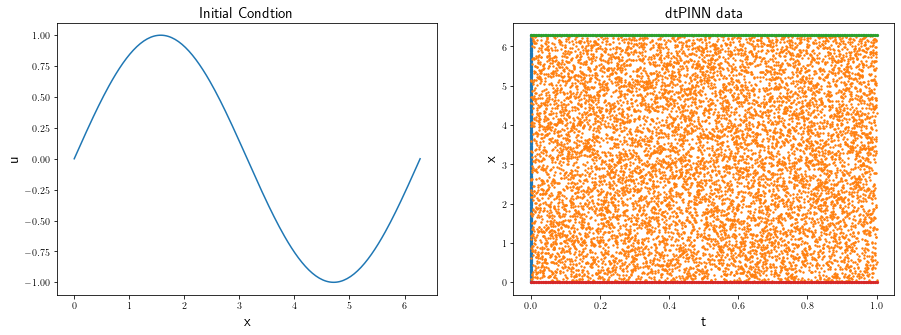

In [4]:
dataPar = generate_trainData(dataPar, userPar)
sample_plot(dataPar, userPar)

## Step 3: Train model and visualize

### Step 3.1: Define training and visualization parameters

In [5]:
### Training visualization parameters
userPar['animation'] = 1; # Boolean for showing/saving snapshots to make animation. If 0, it will just show/save the end of training
userPar['save_fig'] = 1; # Save training figures
userPar['model_name'] = 'convection_PINN_convergence' # Name of file to save training snapshots under
userPar['show_fig'] = 1; # Display training figures
userPar['verbose'] = 1 # Print out various training varibles at train time such as loss and iterations
SEED = 0

### Step 3.2: Initalize the model

In [6]:
print('SEED:', SEED); torch.manual_seed(SEED); np.random.seed(SEED);
model = dtPINN(dataPar, userPar)

SEED: 0


### Step 3.3: Train the model

dtPINN
Train Adam:
epoch 100, loss: 35.433
epoch 200, loss: 21.6211
epoch 300, loss: 9.86476
epoch 400, loss: 5.62654
epoch 500, loss: 3.93543
Training time: 31.4569


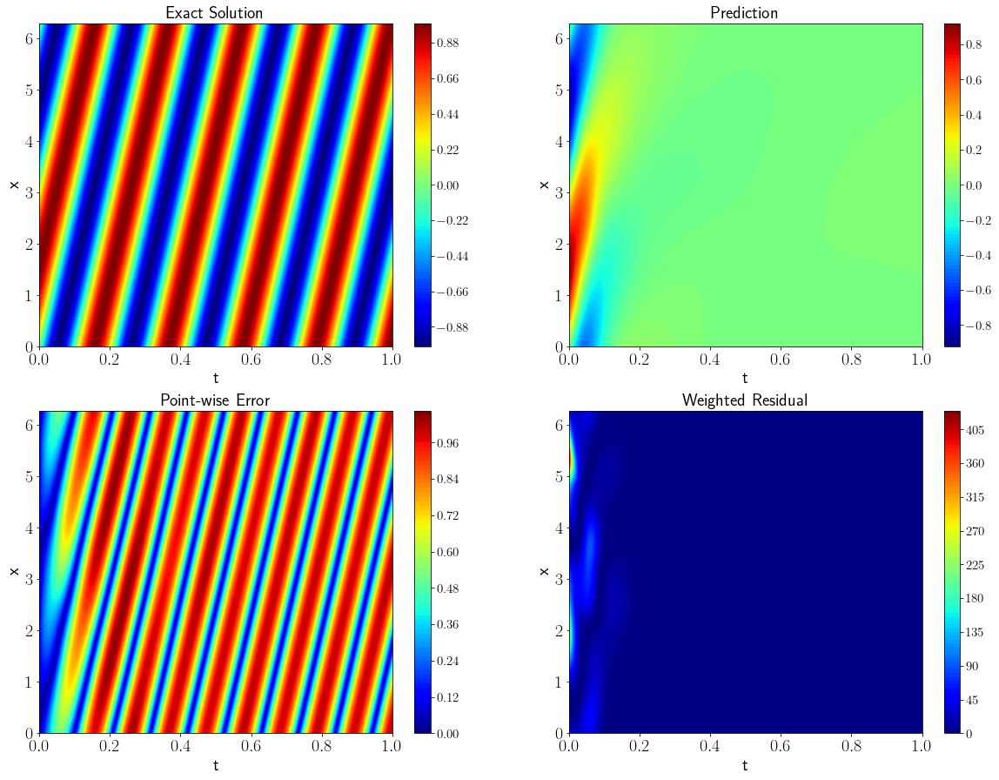

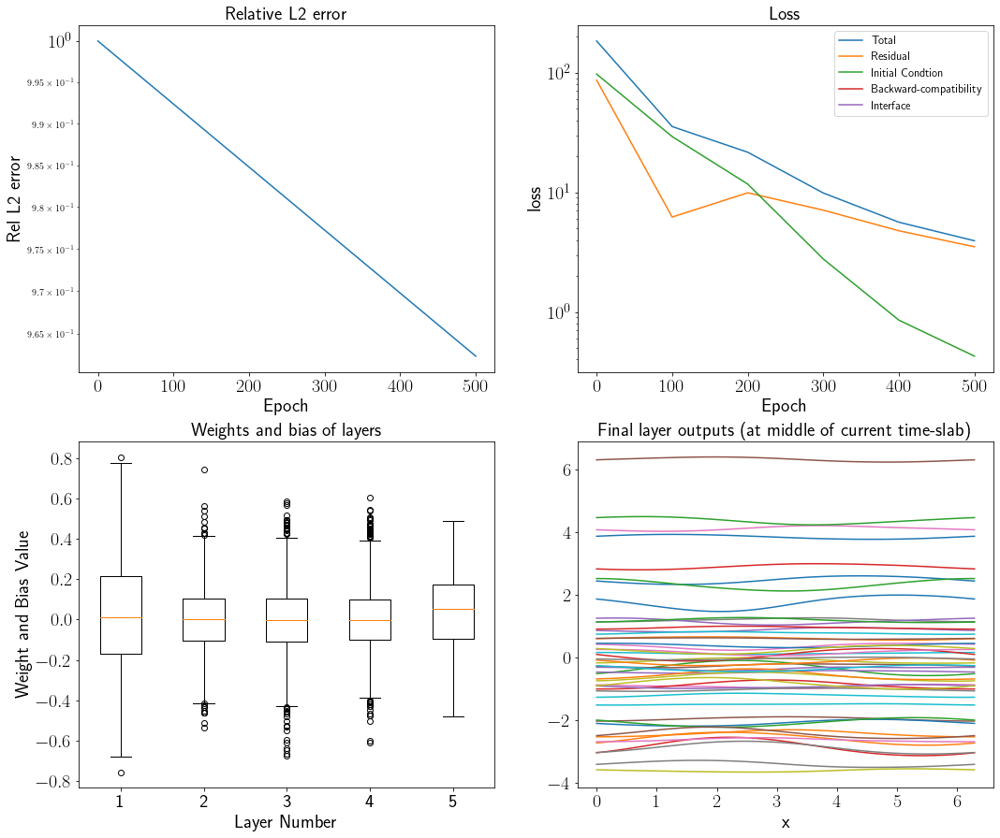

L2-error:  0.962374749838283
Train L-BFGS:
epoch 100, loss: 2.43108, delta loss: 0.00820255
epoch 200, loss: 1.96665, delta loss: 0.00384331
epoch 300, loss: 1.71567, delta loss: 0.00173986
epoch 400, loss: 1.47503, delta loss: 0.00249922
epoch 500, loss: 1.29647, delta loss: 0.00226307
Training time: 70.6827


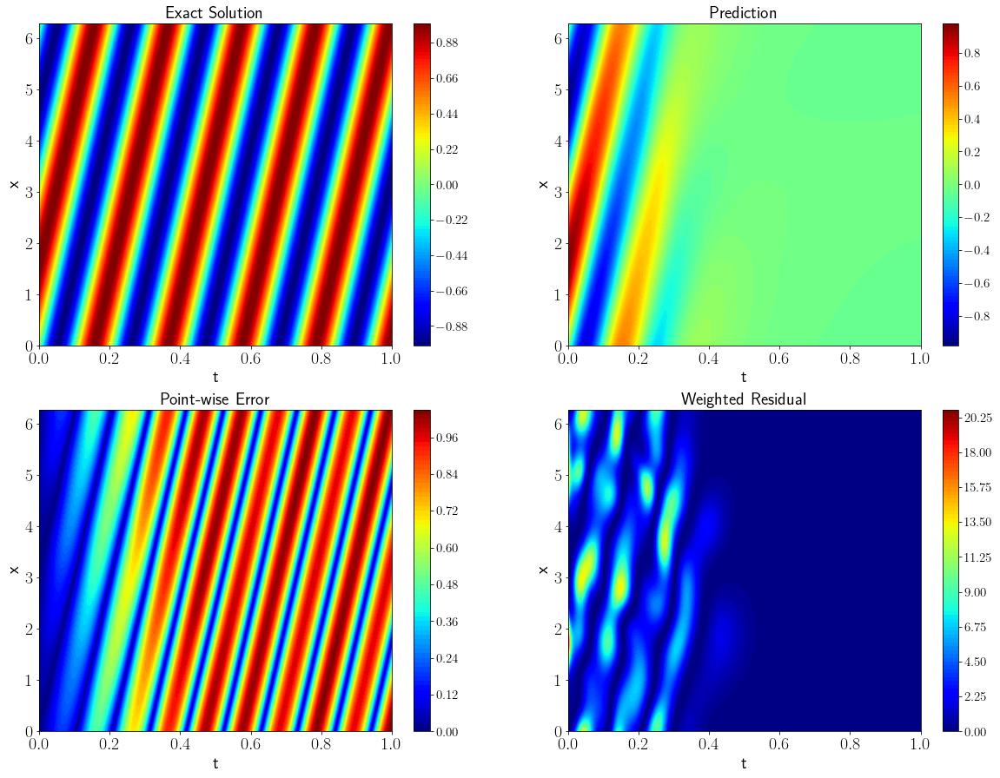

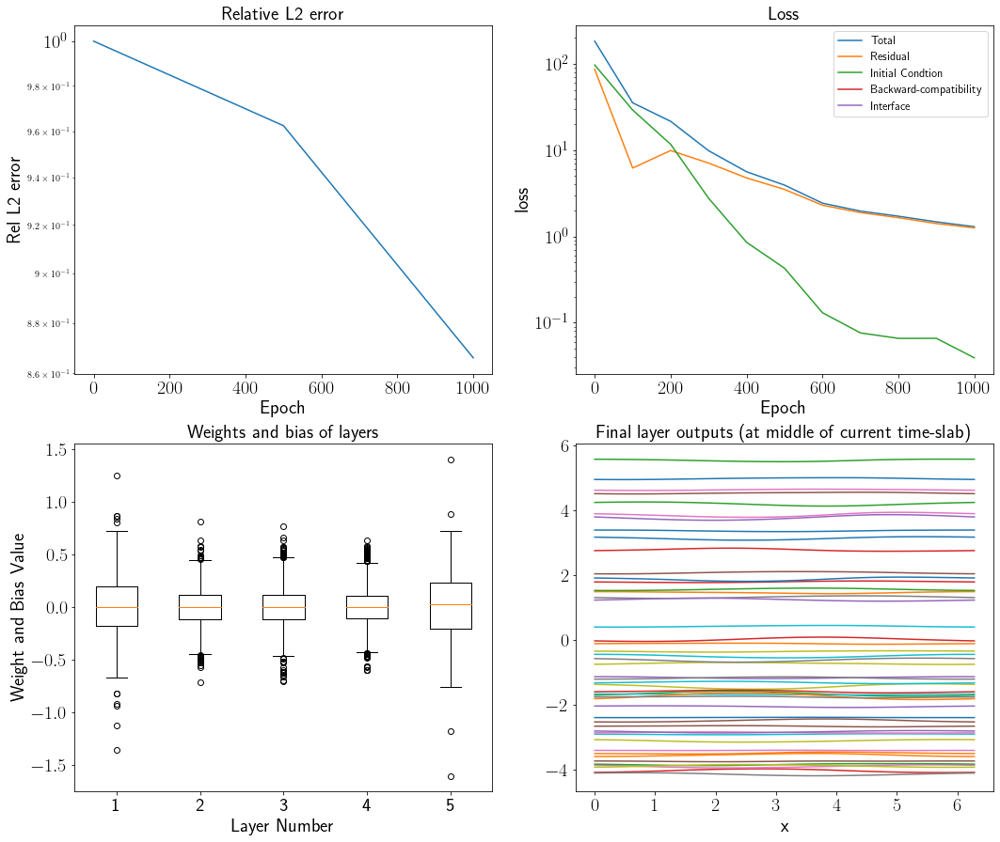

L2-error:  0.8661401275295945
Train L-BFGS:
epoch 100, loss: 1.15684, delta loss: 0.000825524
epoch 200, loss: 1.06462, delta loss: 0.0010463
epoch 300, loss: 0.992916, delta loss: 0.000806808
epoch 400, loss: 0.937685, delta loss: 0.000446856
epoch 500, loss: 0.913346, delta loss: 0.000201643
Training time: 107.6604


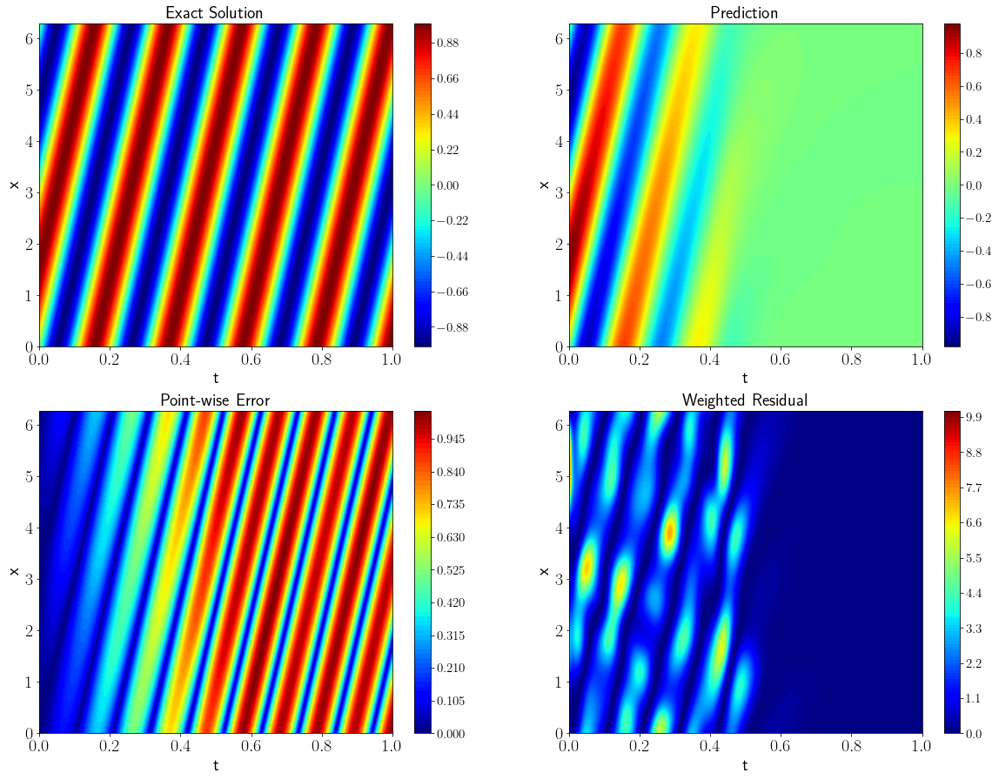

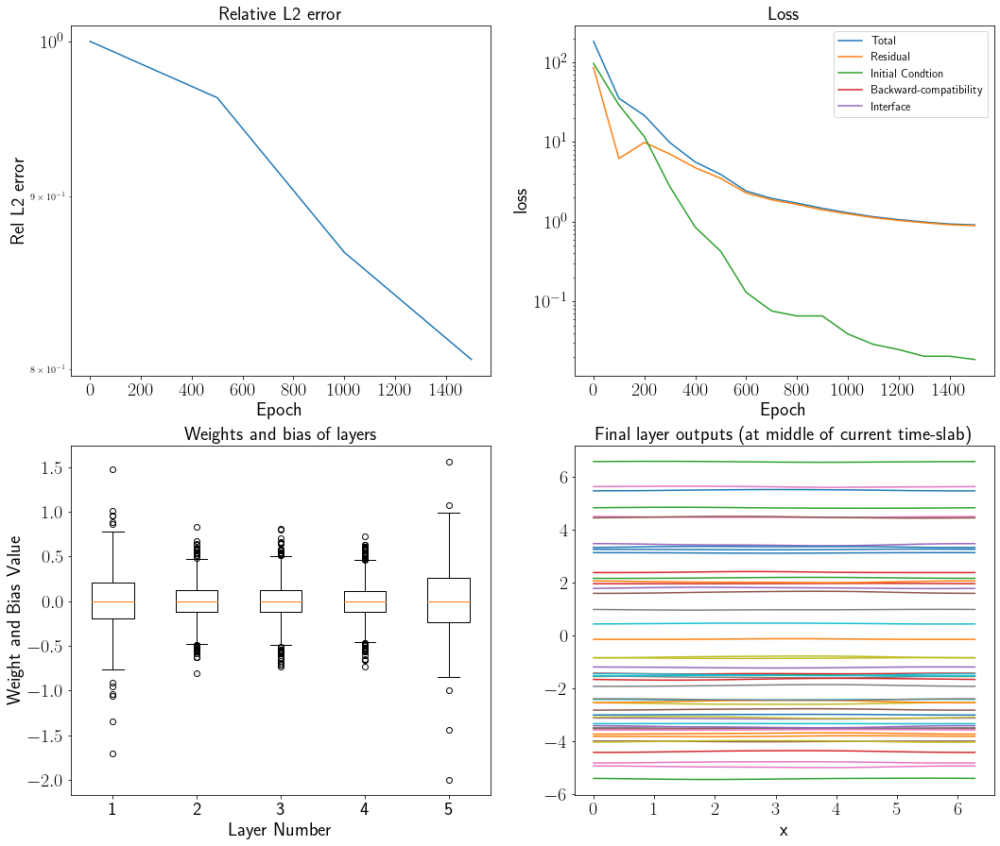

L2-error:  0.8051475183247654
Train L-BFGS:
epoch 100, loss: 0.886554, delta loss: 0.000322938
epoch 200, loss: 0.862509, delta loss: 0.000361025
epoch 300, loss: 0.837072, delta loss: 0.000148833
epoch 400, loss: 0.808248, delta loss: 0.000449181
epoch 500, loss: 0.781512, delta loss: 0.00022918
Training time: 144.4277


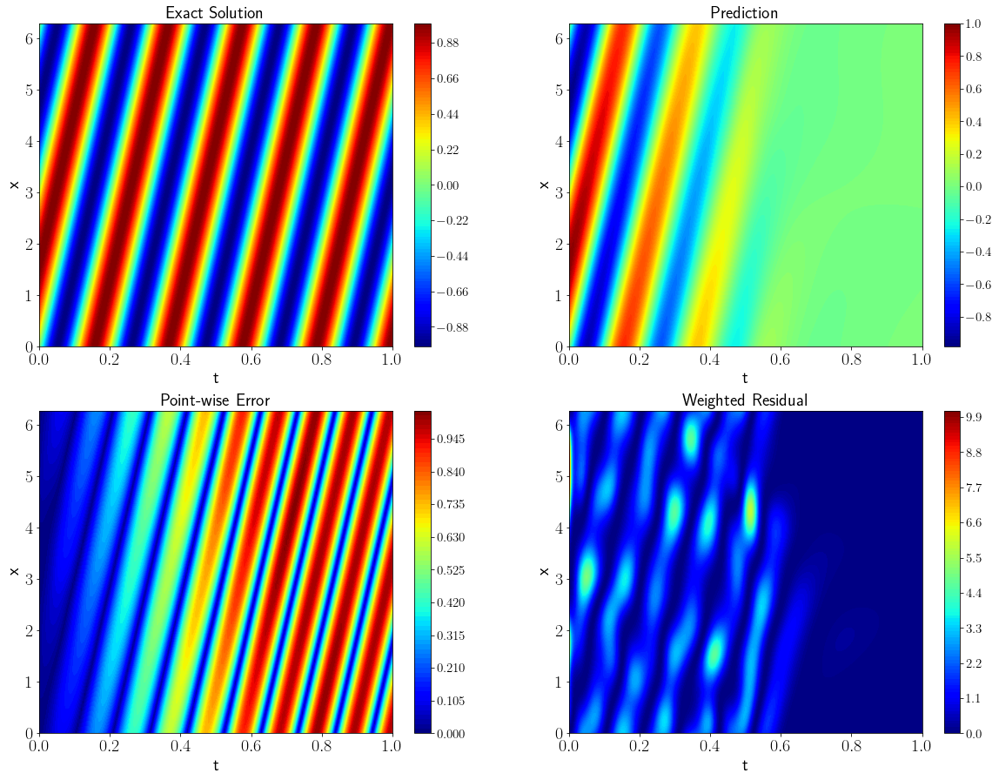

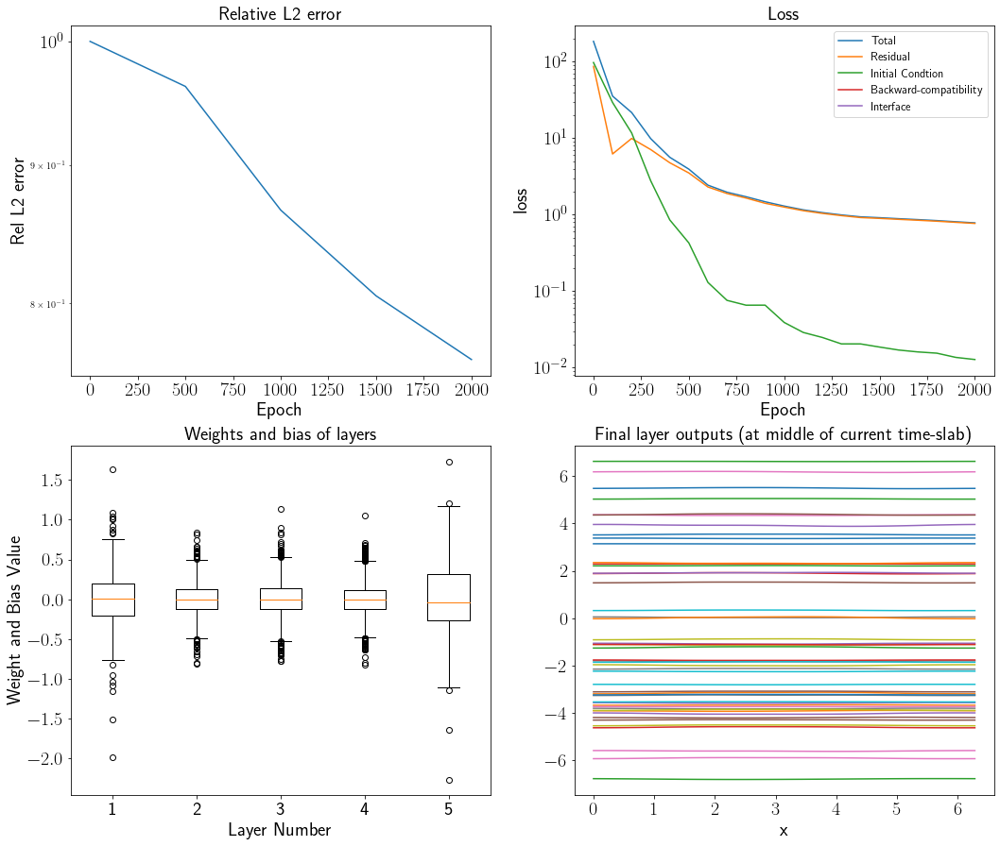

L2-error:  0.7626491490167221
Train L-BFGS:
epoch 100, loss: 0.757372, delta loss: 0.000382721
epoch 200, loss: 0.72585, delta loss: 0.000224054
epoch 300, loss: 0.707363, delta loss: 0.000187814
epoch 400, loss: 0.68899, delta loss: 0.000185788
epoch 500, loss: 0.67503, delta loss: 0.000110149
Training time: 180.3496


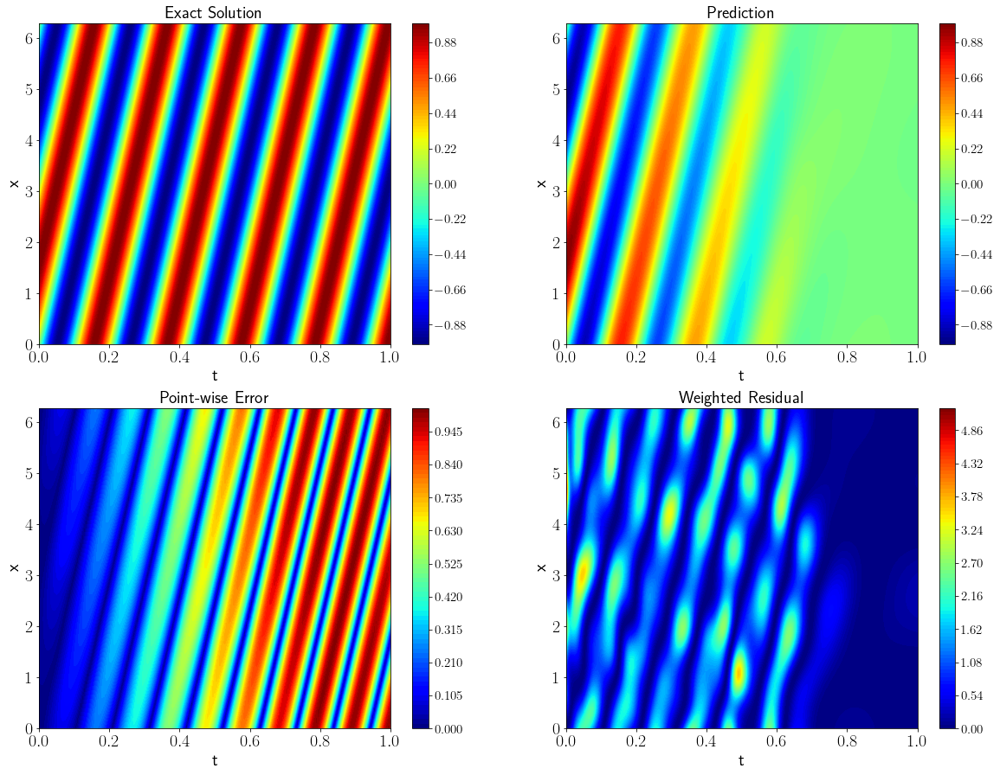

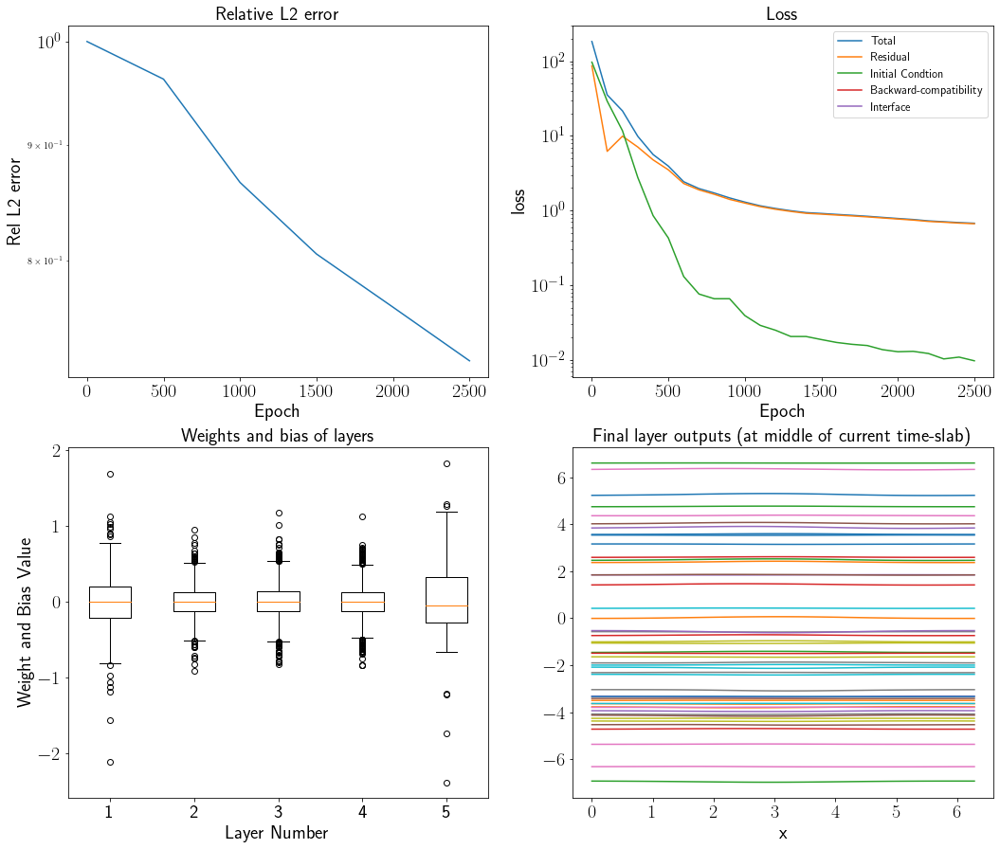

L2-error:  0.7220600255584079
Train L-BFGS:
epoch 100, loss: 0.66417, delta loss: 5.85914e-05
epoch 200, loss: 0.655987, delta loss: 7.77841e-05
epoch 300, loss: 0.648627, delta loss: 6.19292e-05
epoch 400, loss: 0.641282, delta loss: 8.51154e-05
epoch 500, loss: 0.633298, delta loss: 5.53727e-05
Training time: 216.3133


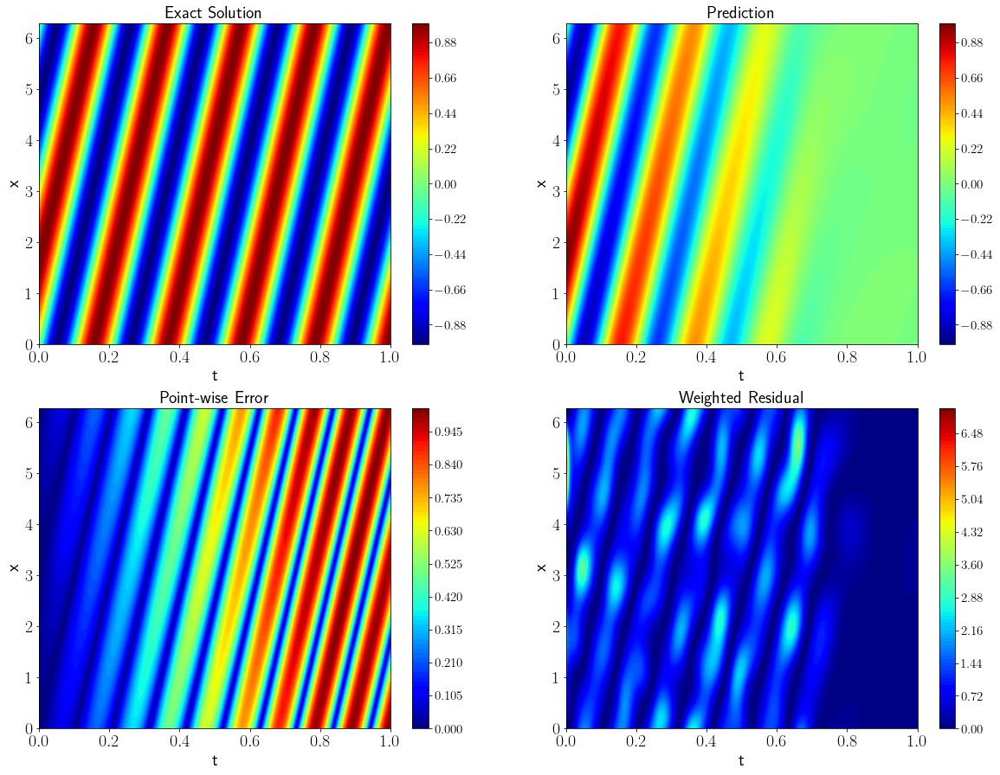

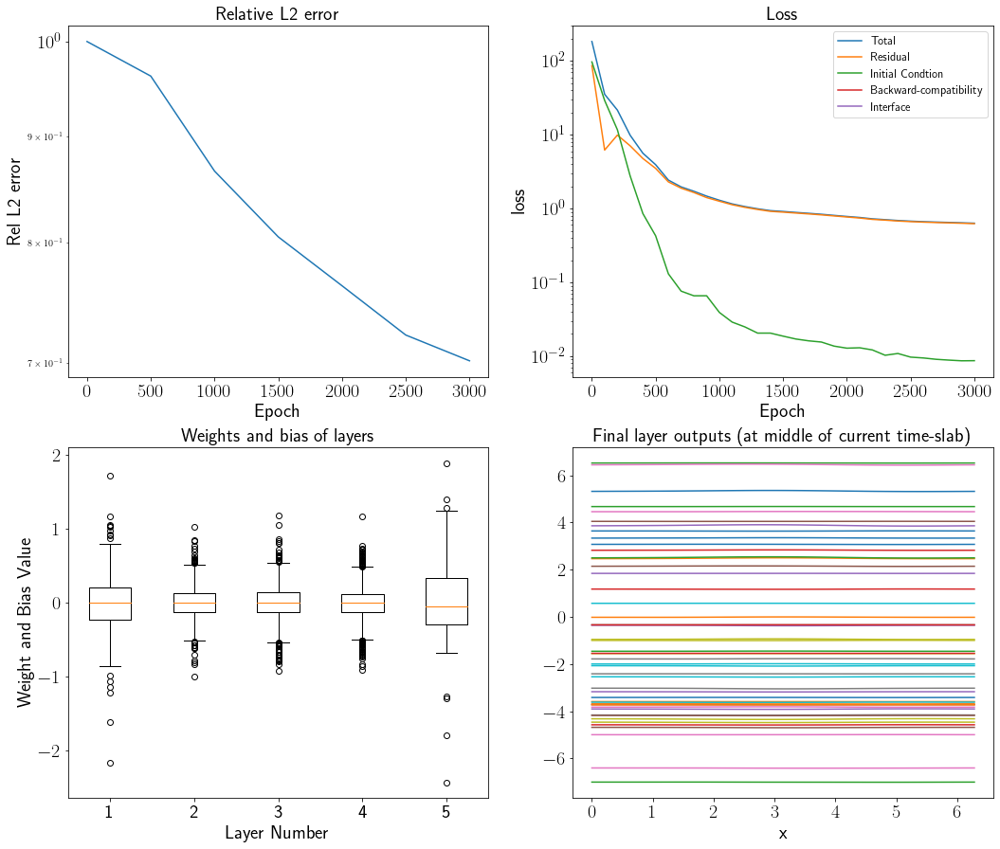

L2-error:  0.7017089473550672
Train L-BFGS:
epoch 100, loss: 0.623787, delta loss: 8.94666e-05
epoch 200, loss: 0.613528, delta loss: 0.000107884
epoch 300, loss: 0.601382, delta loss: 8.72612e-05
epoch 400, loss: 0.593101, delta loss: 6.05583e-05
epoch 500, loss: 0.585936, delta loss: 3.00407e-05
Training time: 252.3824


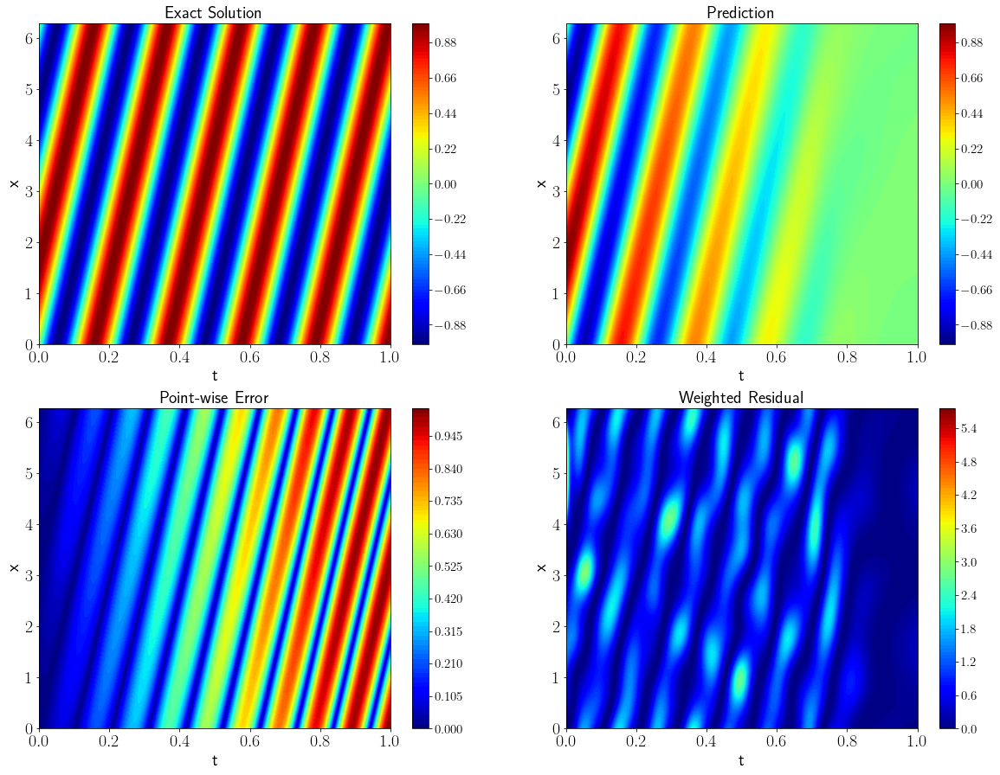

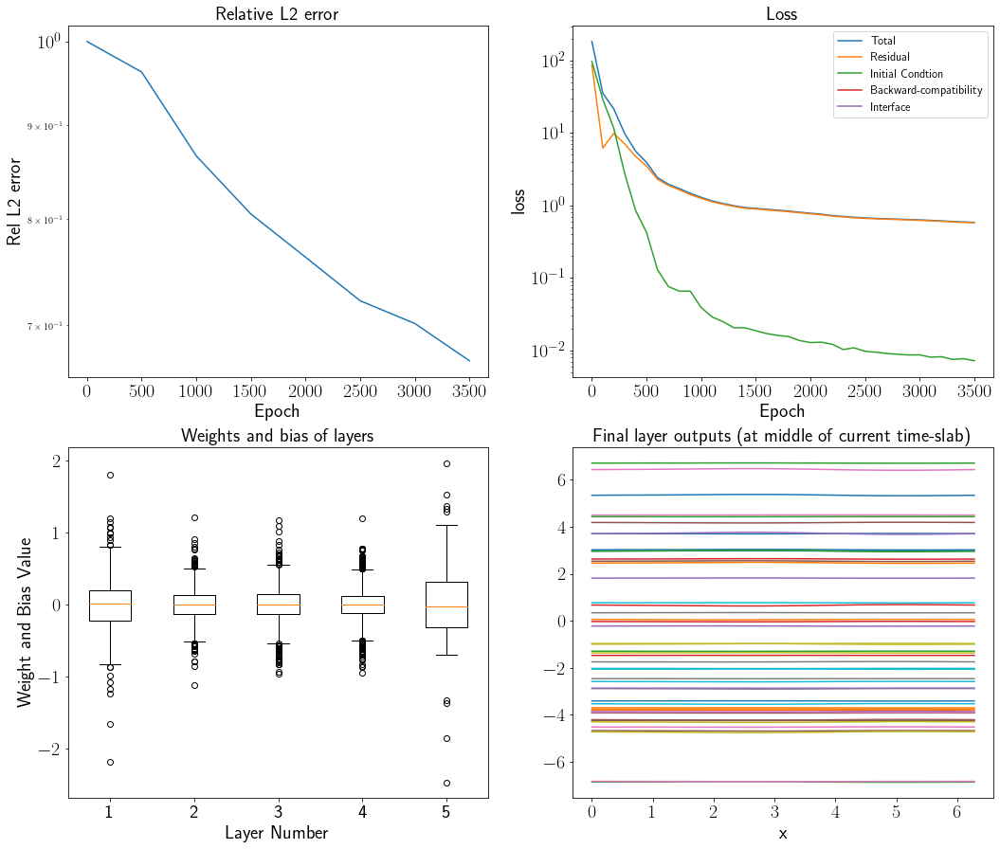

L2-error:  0.6696138785312558
Train L-BFGS:
epoch 100, loss: 0.580389, delta loss: 5.04851e-05
epoch 200, loss: 0.573917, delta loss: 8.79169e-05
epoch 300, loss: 0.568409, delta loss: 5.59092e-05
epoch 400, loss: 0.564447, delta loss: 2.99811e-05
epoch 500, loss: 0.560575, delta loss: 3.23653e-05
Training time: 288.4683


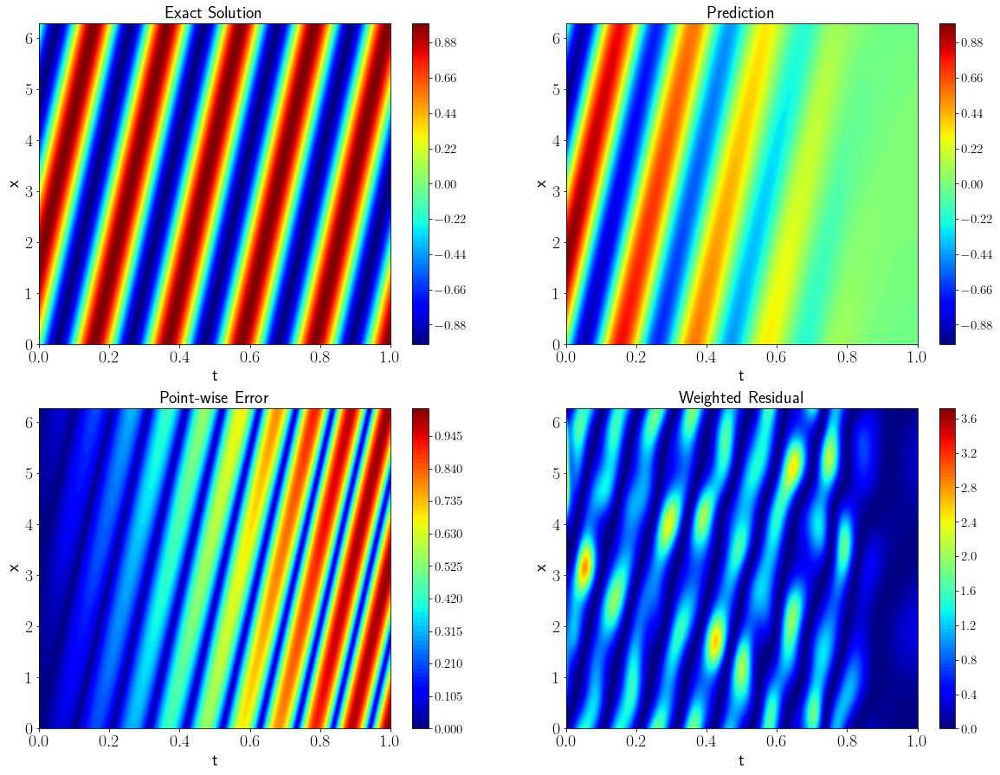

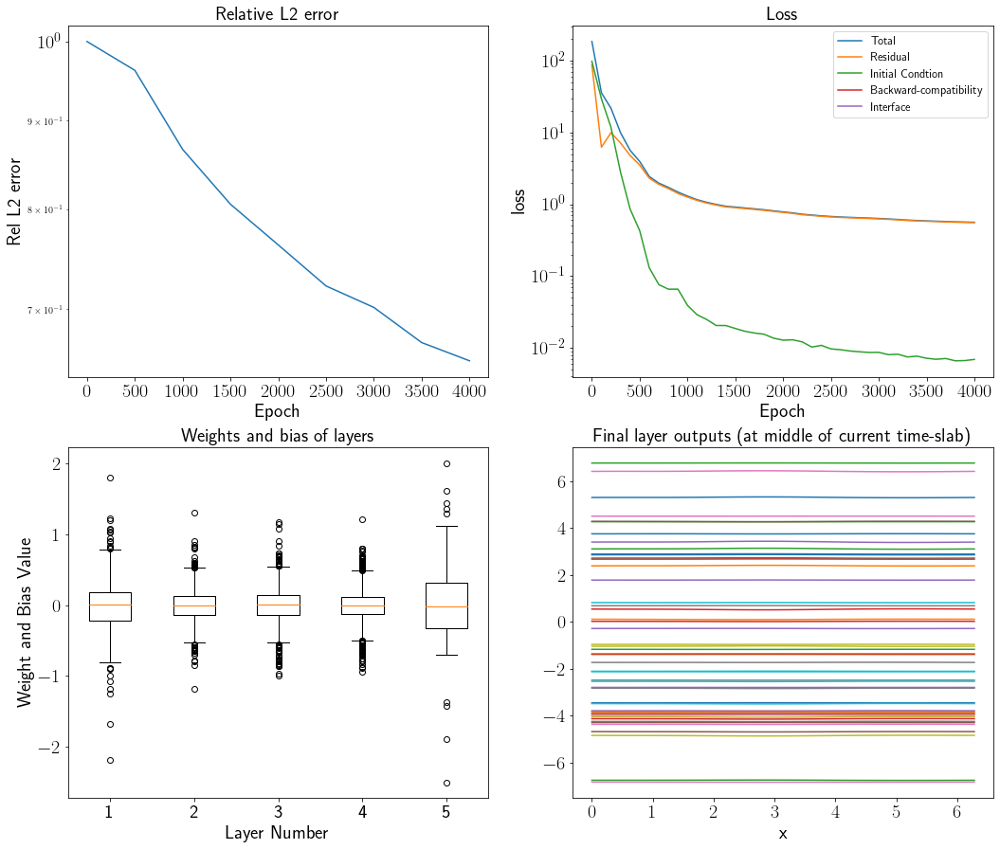

L2-error:  0.6535489652850525
Train L-BFGS:
epoch 100, loss: 0.554603, delta loss: 5.56111e-05
epoch 200, loss: 0.5478, delta loss: 3.94583e-05
epoch 300, loss: 0.541436, delta loss: 5.81145e-05
epoch 400, loss: 0.534849, delta loss: 6.68764e-05
epoch 500, loss: 0.525632, delta loss: 9.71556e-05
Training time: 324.4142


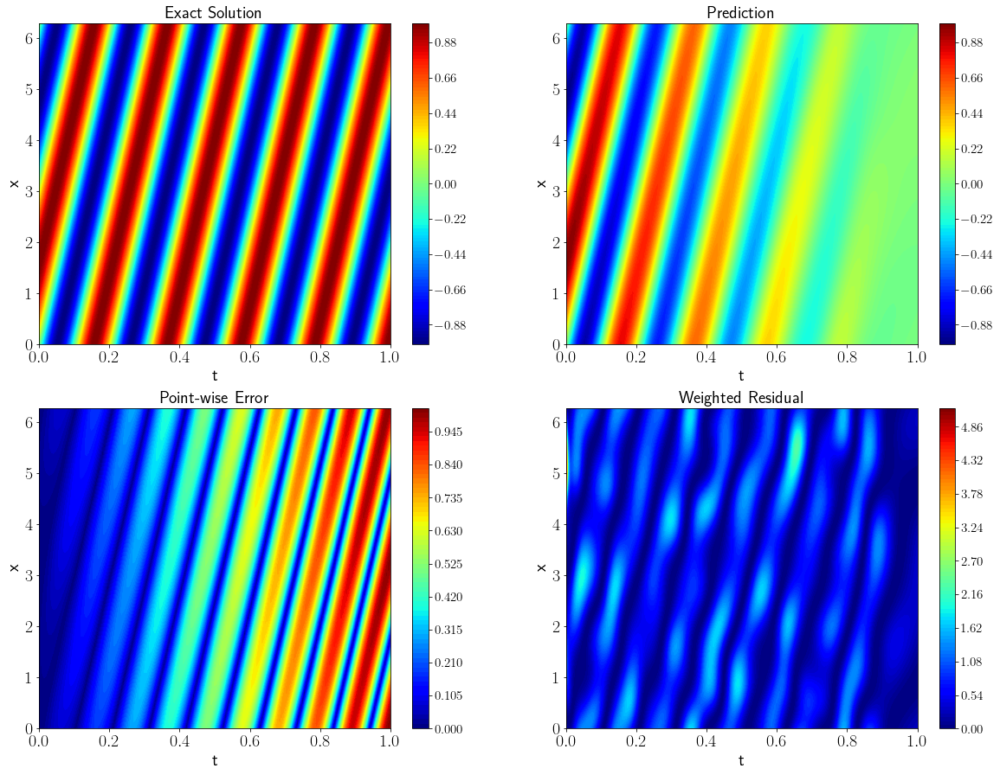

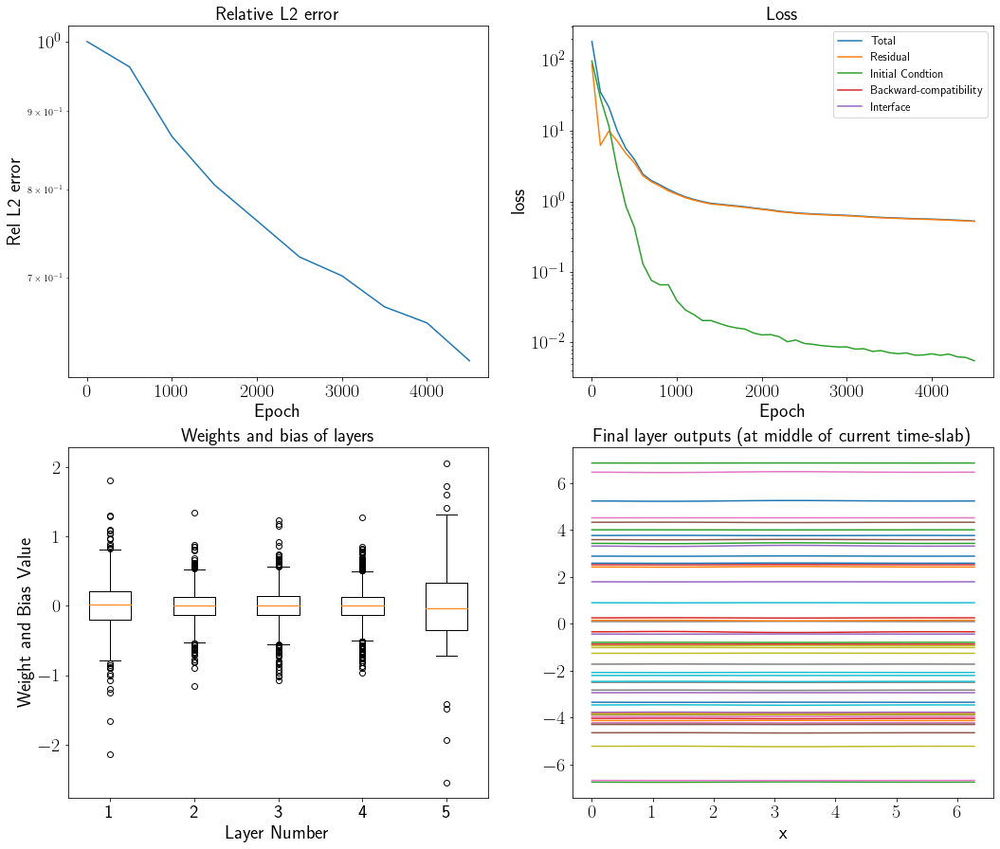

L2-error:  0.6171575789987342
Train L-BFGS:
epoch 100, loss: 0.51791, delta loss: 7.689e-05
epoch 200, loss: 0.511291, delta loss: 5.67436e-05
epoch 300, loss: 0.506108, delta loss: 6.6638e-05
epoch 400, loss: 0.498027, delta loss: 7.09891e-05
epoch 500, loss: 0.492252, delta loss: 4.78029e-05
Training time: 359.3326


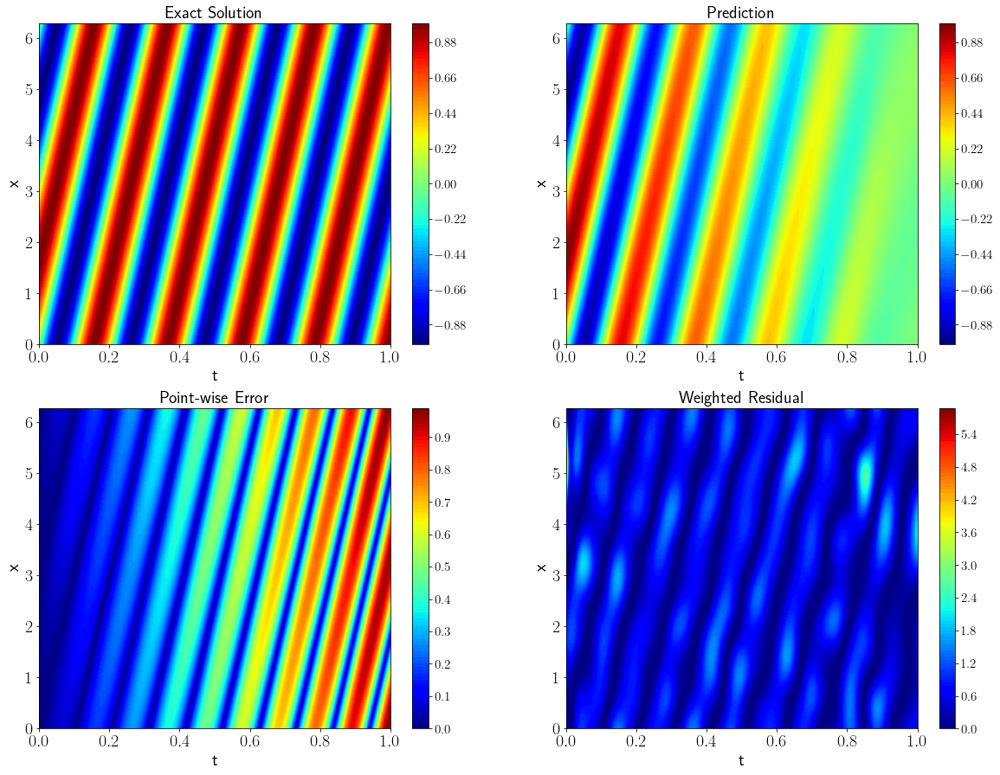

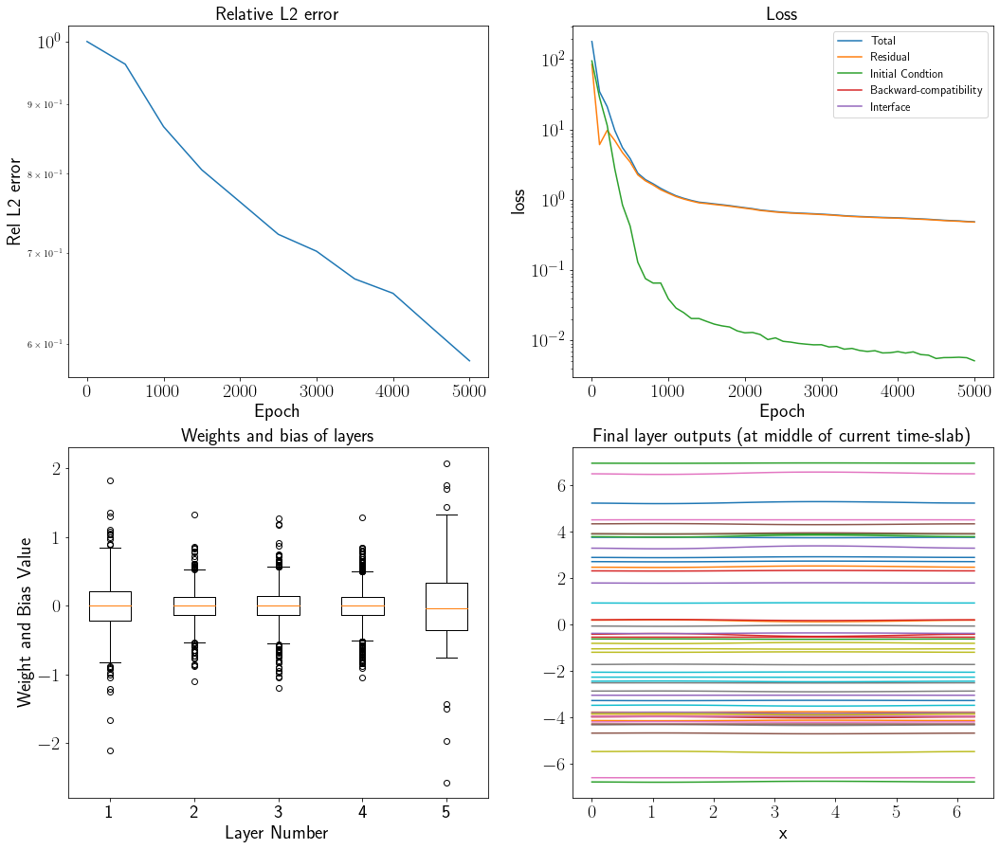

L2-error:  0.5831327565349593
Train L-BFGS:
epoch 100, loss: 0.483245, delta loss: 0.000104249
epoch 200, loss: 0.469598, delta loss: 0.000125259
epoch 300, loss: 0.441518, delta loss: 0.000398159
epoch 400, loss: 0.417248, delta loss: 0.00025925
epoch 500, loss: 0.390469, delta loss: 0.000140309
Training time: 393.7055


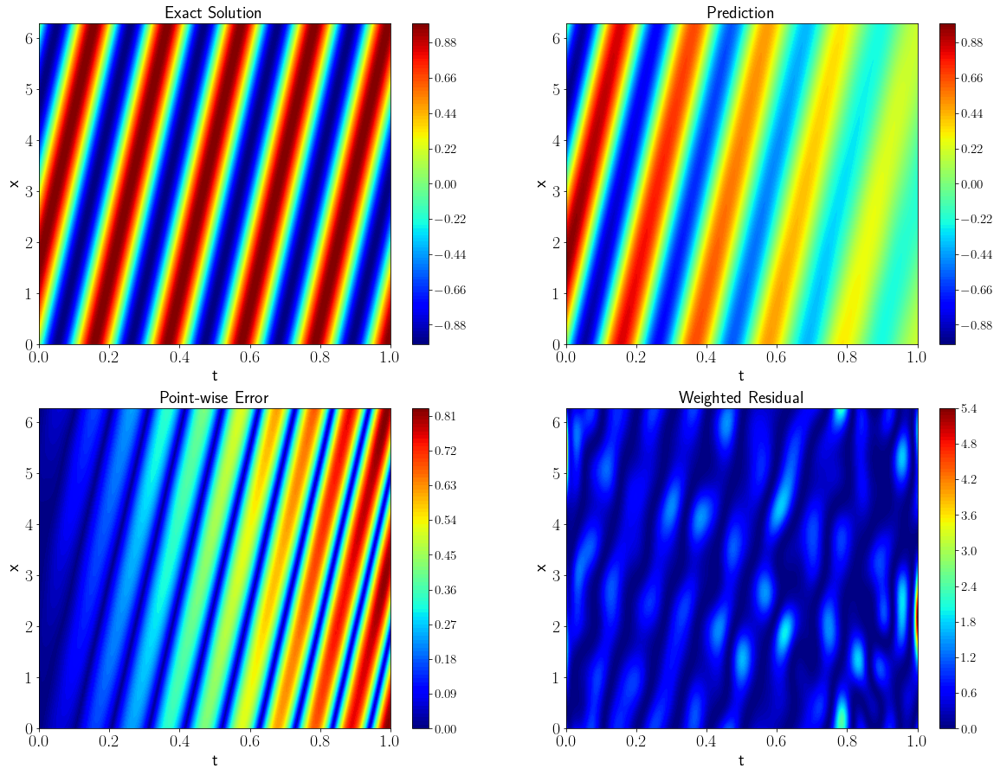

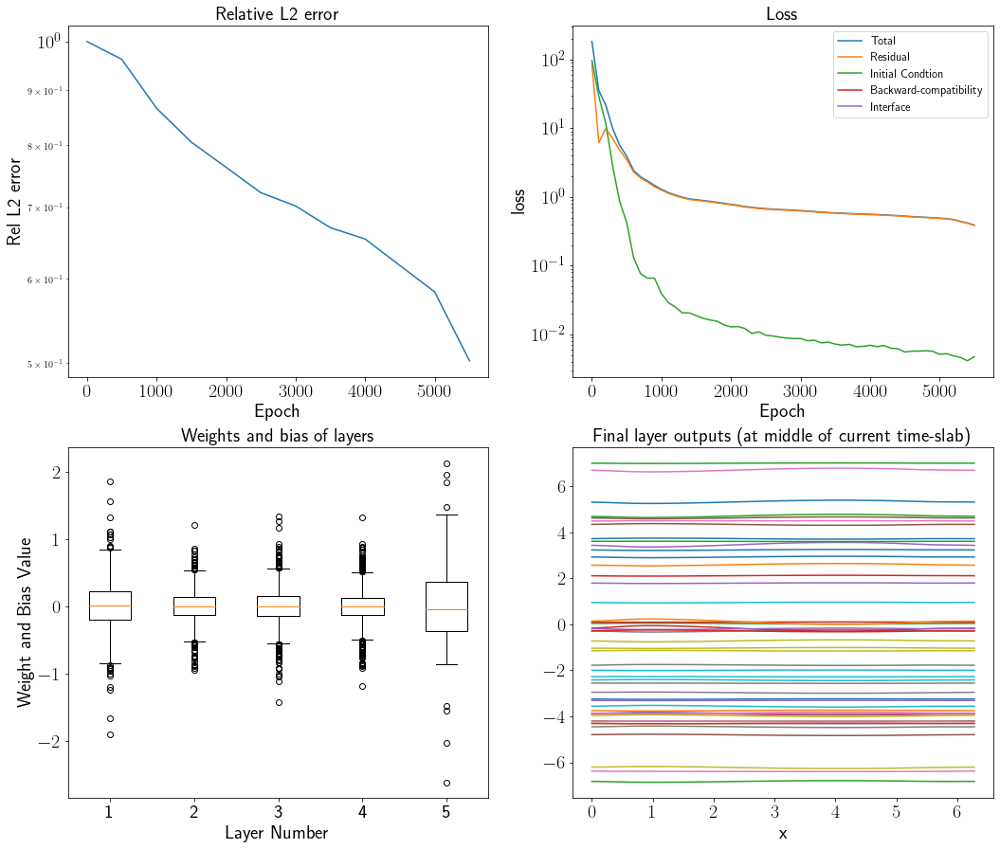

L2-error:  0.5027484337113616
Train L-BFGS:
epoch 100, loss: 0.365691, delta loss: 0.000276089
epoch 200, loss: 0.326956, delta loss: 0.000479937
epoch 300, loss: 0.288026, delta loss: 0.000362575
epoch 400, loss: 0.239696, delta loss: 0.000490621
epoch 500, loss: 0.207517, delta loss: 0.000275552
Training time: 428.7951


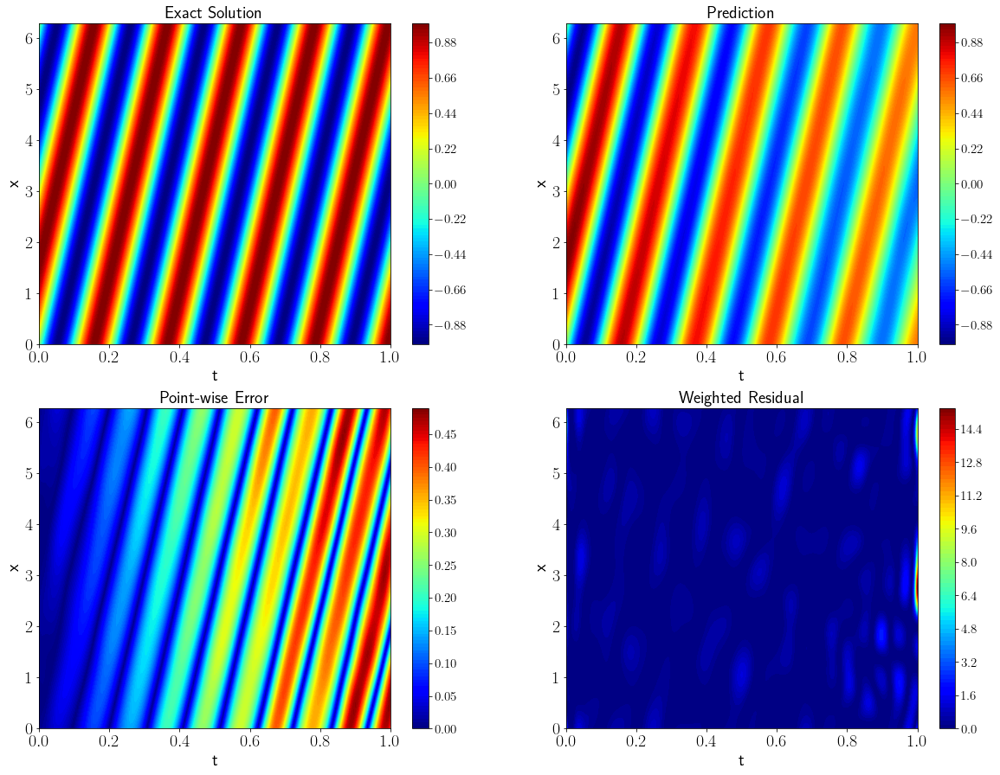

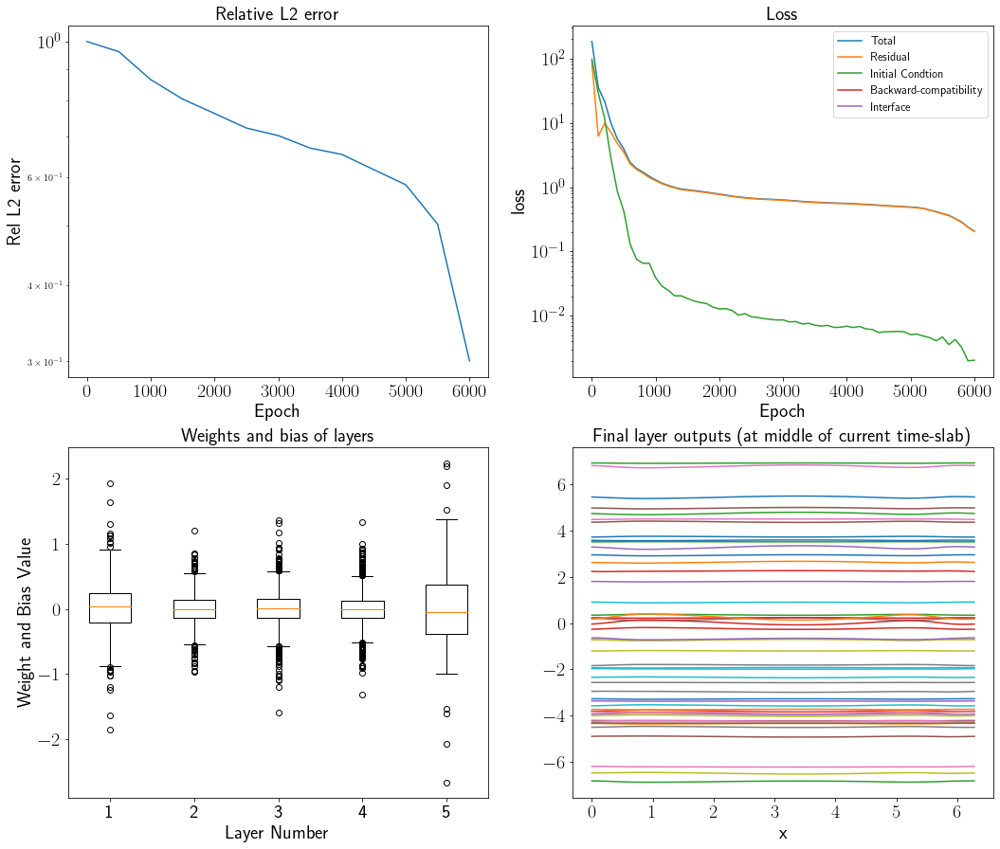

L2-error:  0.3005430422195853
Train L-BFGS:
epoch 100, loss: 0.178289, delta loss: 0.000280857
epoch 200, loss: 0.145587, delta loss: 0.000431925
epoch 300, loss: 0.111832, delta loss: 0.000252031
epoch 400, loss: 0.0870022, delta loss: 0.000172146
epoch 500, loss: 0.0744993, delta loss: 9.48608e-05
Training time: 464.7974


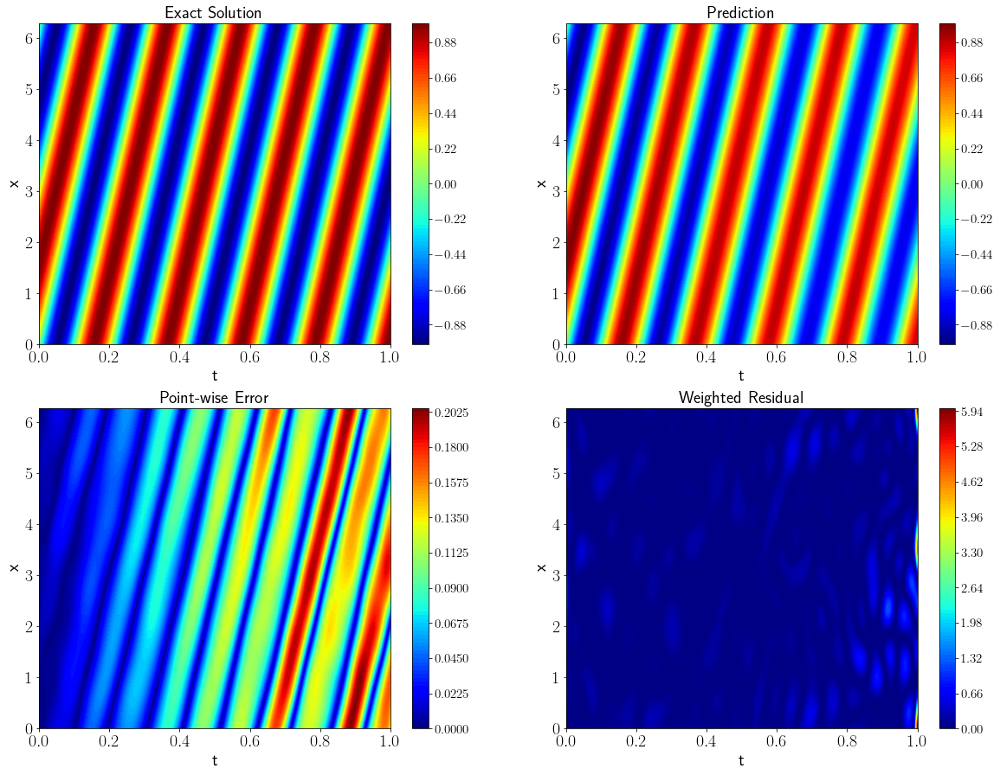

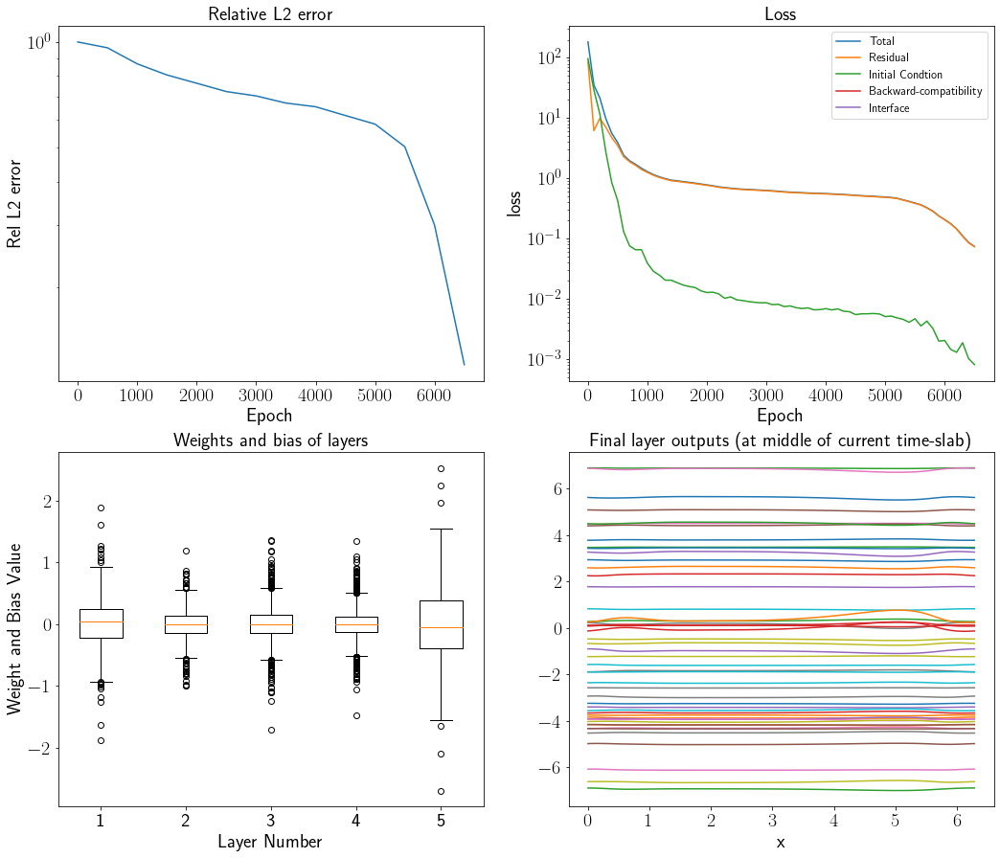

L2-error:  0.12026111572269078
Train L-BFGS:
epoch 100, loss: 0.0604901, delta loss: 0.000163909
epoch 200, loss: 0.0500046, delta loss: 5.34318e-05
epoch 300, loss: 0.0411718, delta loss: 7.32914e-05
epoch 400, loss: 0.0358954, delta loss: 7.22595e-05
epoch 500, loss: 0.0311034, delta loss: 4.97997e-05
Training time: 499.1334


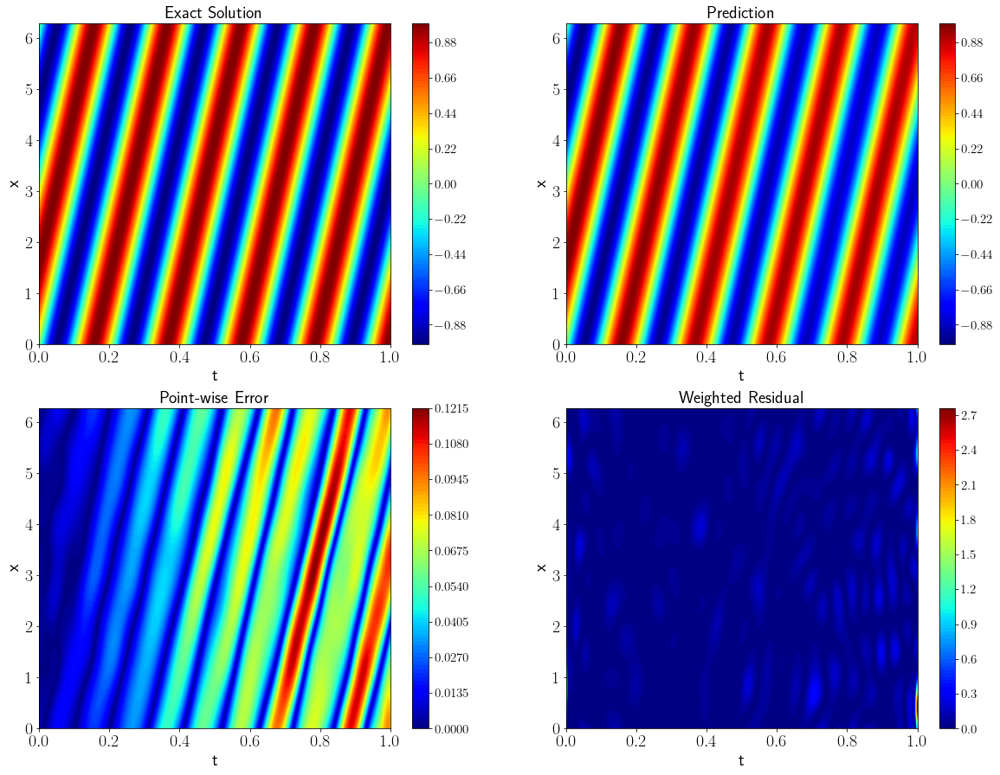

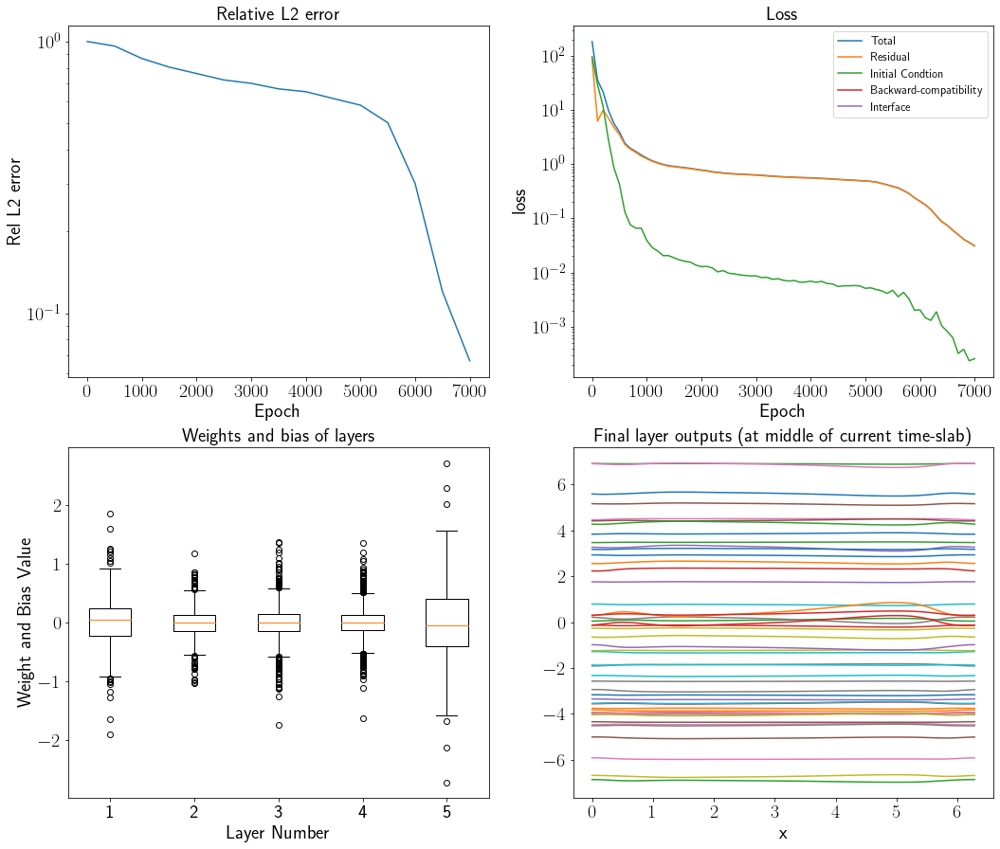

L2-error:  0.06684056099237172
Train L-BFGS:
epoch 100, loss: 0.0275845, delta loss: 3.74261e-05
epoch 200, loss: 0.0239449, delta loss: 2.94447e-05
epoch 300, loss: 0.021549, delta loss: 2.28304e-05
epoch 400, loss: 0.0195018, delta loss: 1.94982e-05
epoch 500, loss: 0.0179118, delta loss: 1.67713e-05
Training time: 533.5460


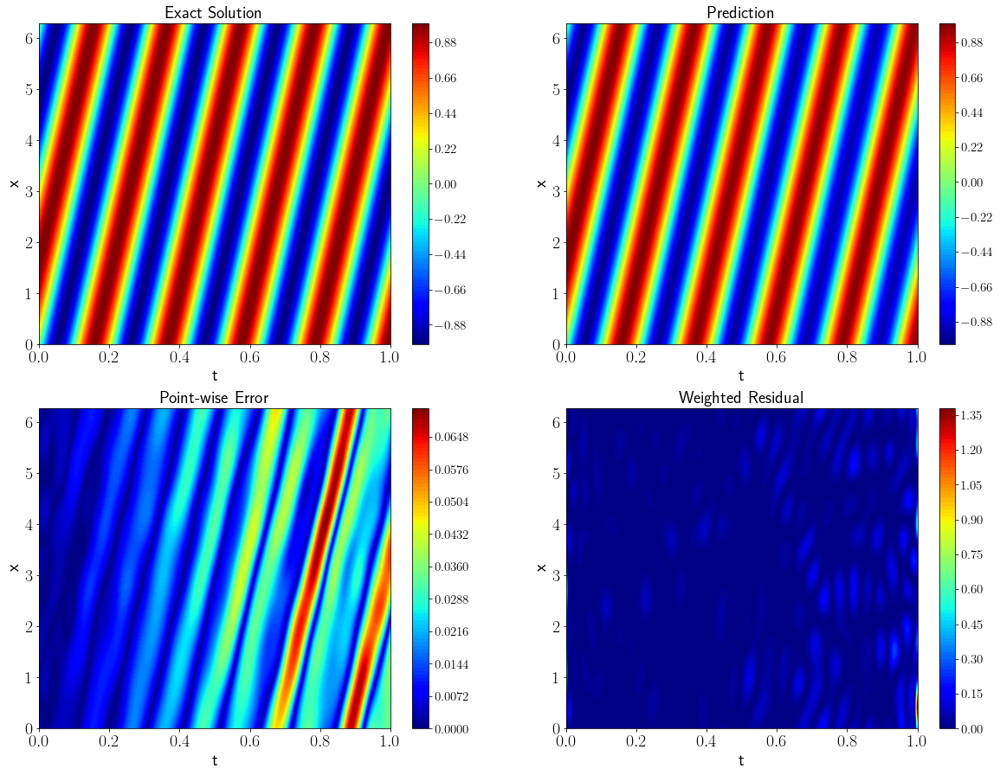

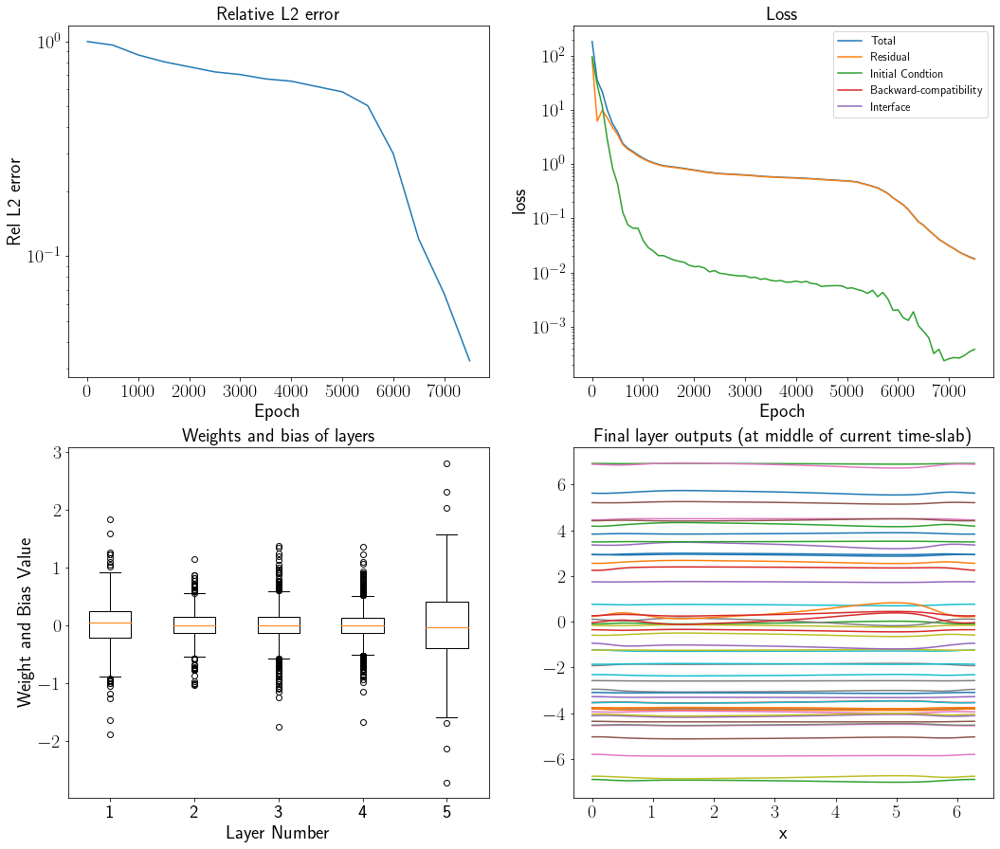

L2-error:  0.032582848219940744
Train L-BFGS:
epoch 100, loss: 0.0160696, delta loss: 1.45547e-05
epoch 200, loss: 0.0144811, delta loss: 1.01095e-05
epoch 300, loss: 0.0130178, delta loss: 1.23e-05
epoch 400, loss: 0.0118342, delta loss: 9.50973e-06
epoch 500, loss: 0.0106958, delta loss: 1.26436e-05
Training time: 569.9319


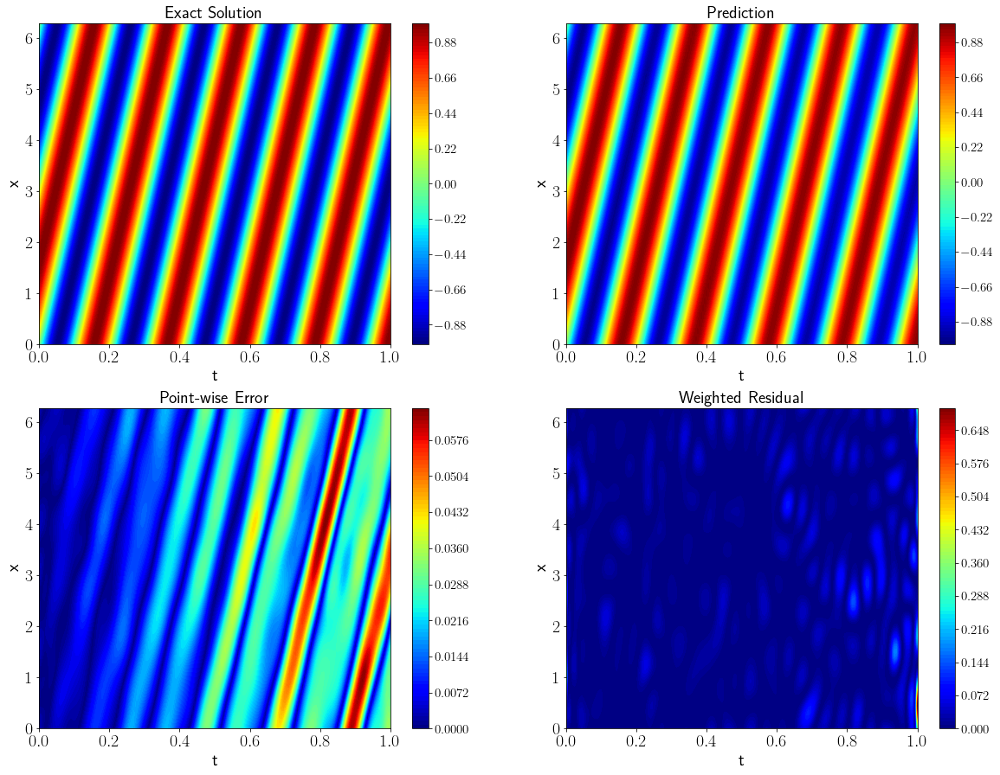

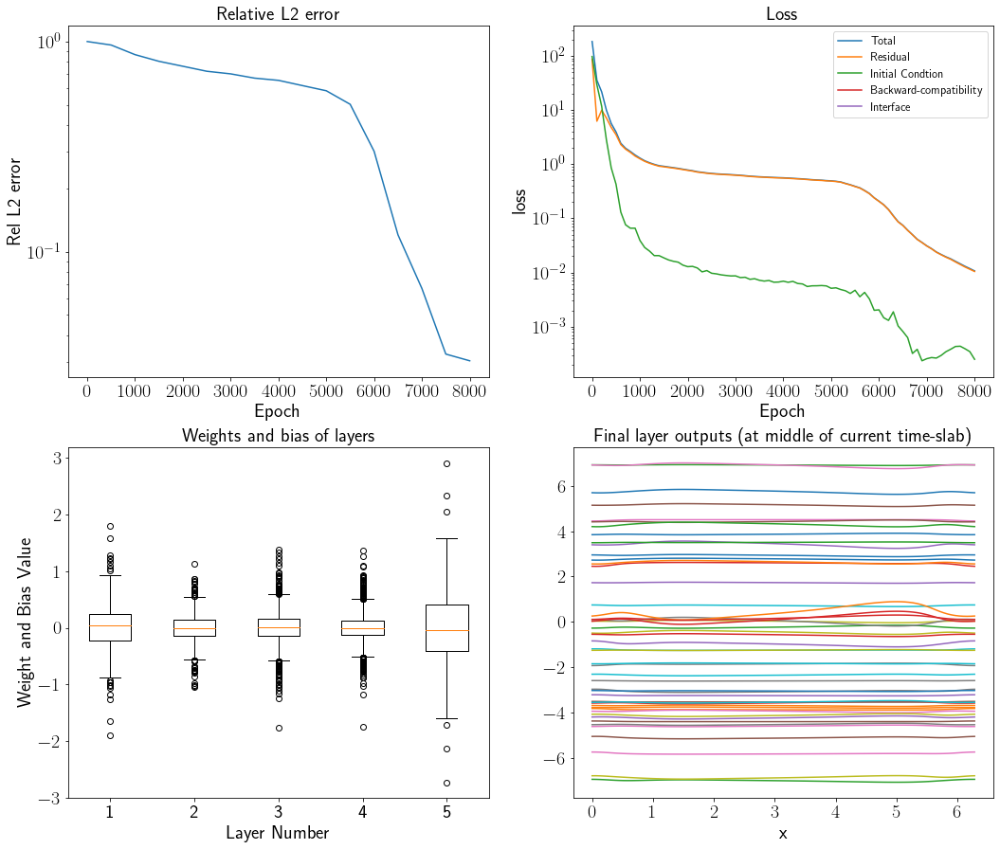

L2-error:  0.030275070938162056
Train L-BFGS:
epoch 100, loss: 0.00955713, delta loss: 1.07875e-05
epoch 200, loss: 0.00863716, delta loss: 9.72115e-06
epoch 300, loss: 0.00789352, delta loss: 7.96467e-06
epoch 400, loss: 0.00717393, delta loss: 5.60004e-06
epoch 500, loss: 0.00668362, delta loss: 5.94324e-06
Training time: 604.7292


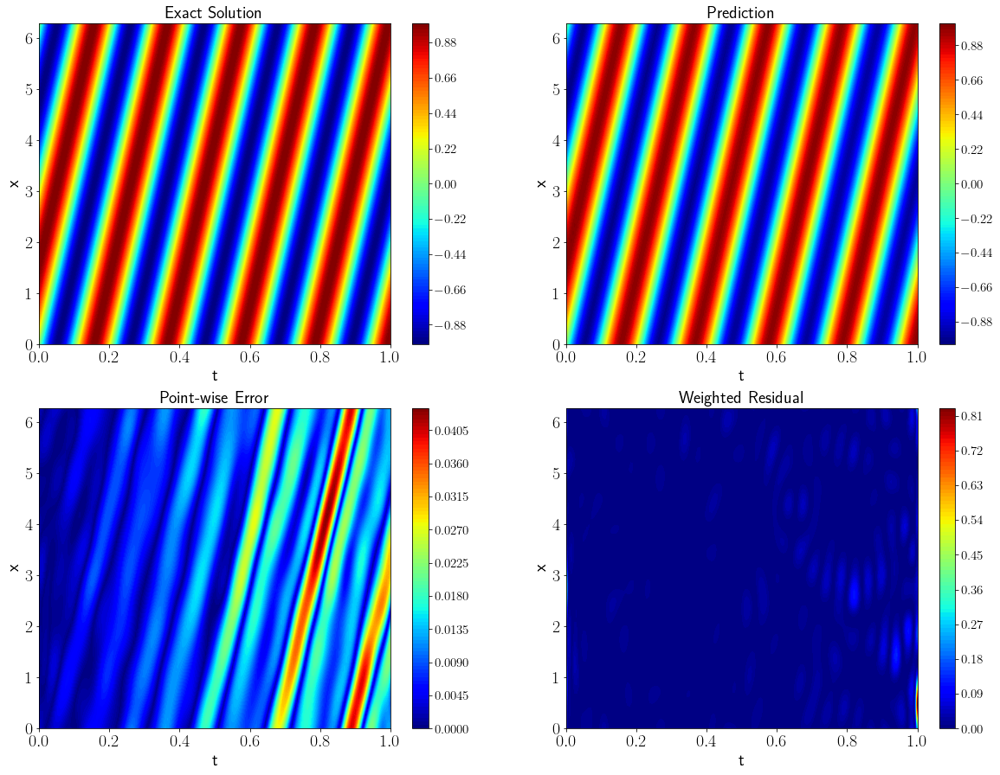

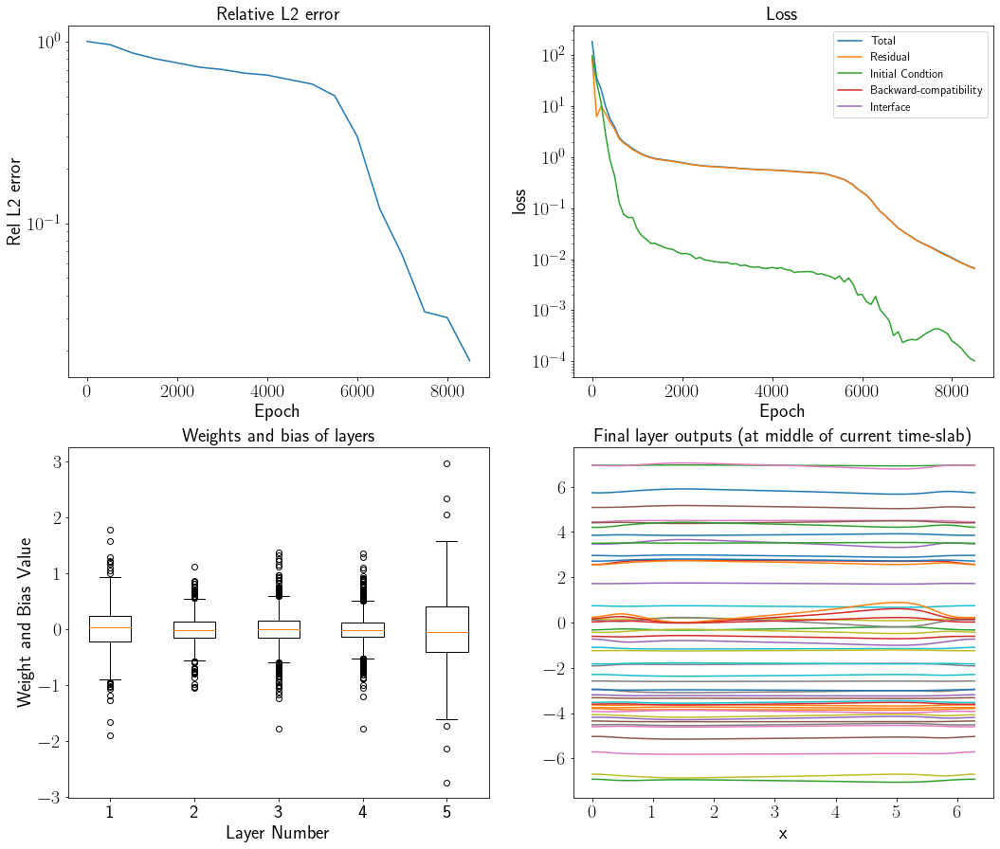

L2-error:  0.017520997180019027
Train L-BFGS:
epoch 100, loss: 0.00615958, delta loss: 3.13437e-06
epoch 200, loss: 0.00582289, delta loss: 3.33227e-06
epoch 300, loss: 0.00539027, delta loss: 4.19933e-06
epoch 400, loss: 0.00496142, delta loss: 2.97697e-06
epoch 500, loss: 0.00467535, delta loss: 1.13063e-06
Training time: 639.8793


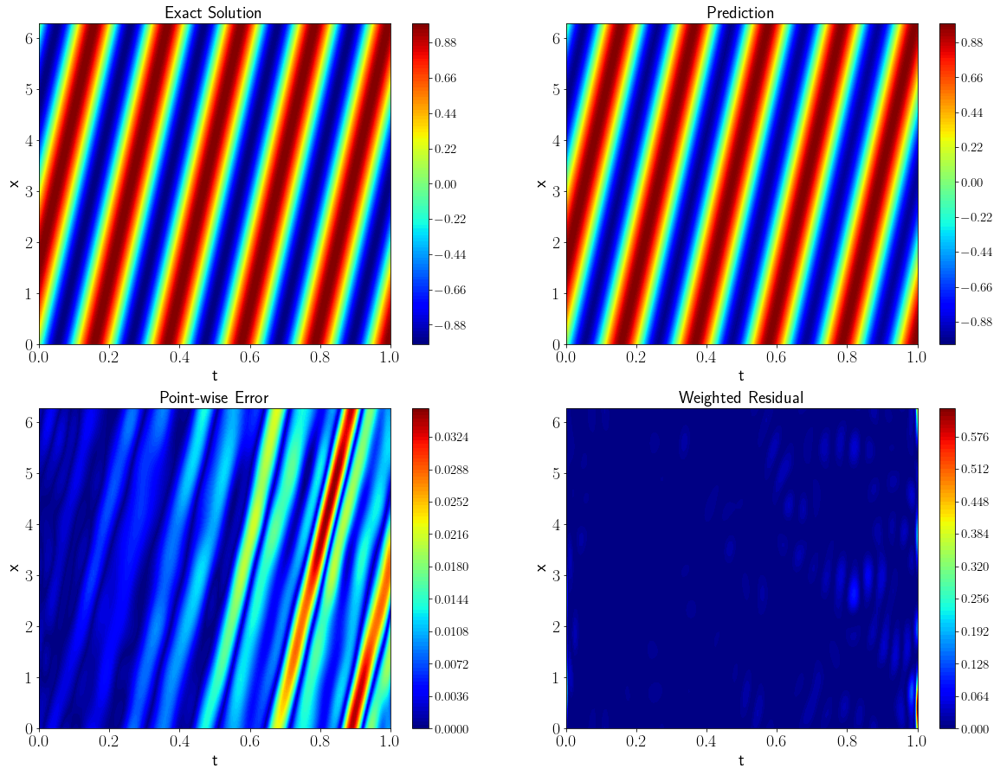

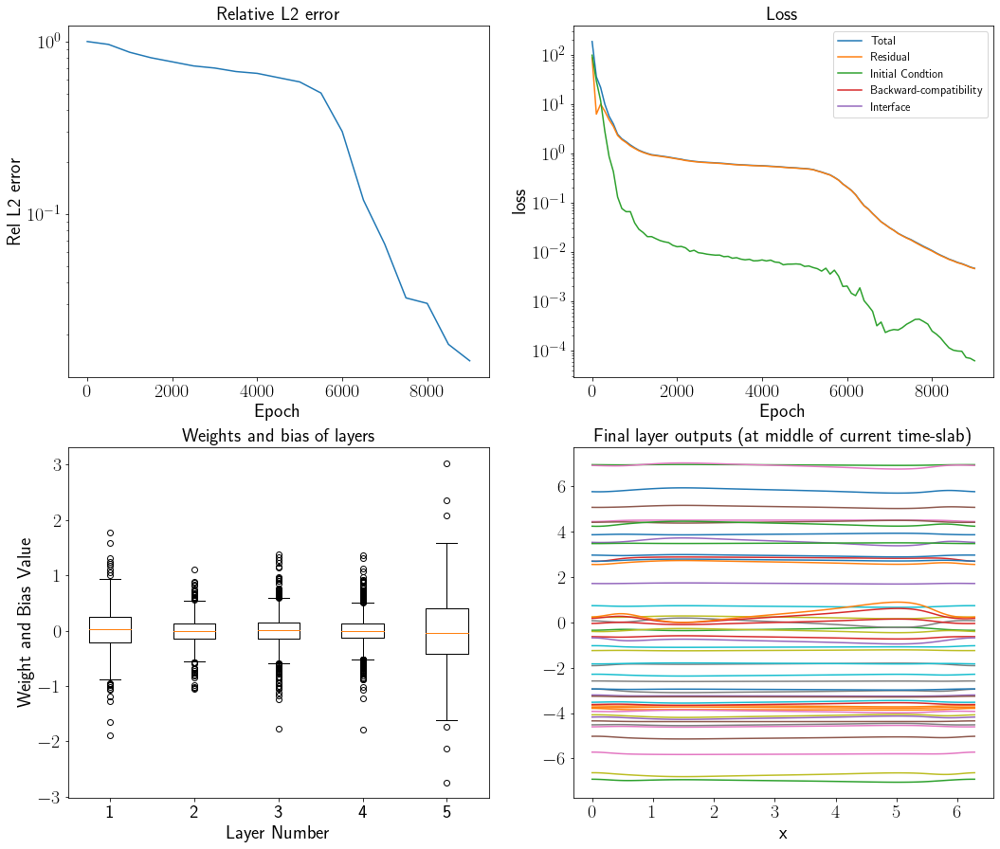

L2-error:  0.01406647197588614
Train L-BFGS:
epoch 100, loss: 0.0044947, delta loss: 2.72645e-06
epoch 200, loss: 0.00428557, delta loss: 1.97953e-06
epoch 300, loss: 0.00412906, delta loss: 1.33365e-06
epoch 400, loss: 0.0039787, delta loss: 1.25589e-06
epoch 500, loss: 0.00383516, delta loss: 1.30408e-06
Training time: 675.2835


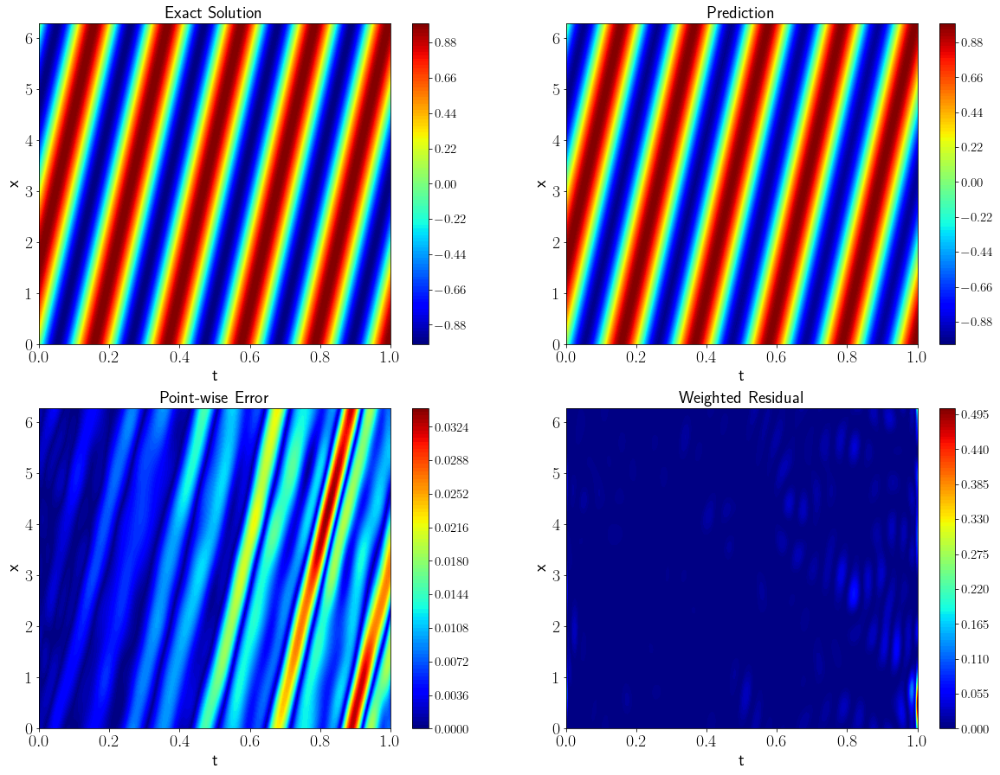

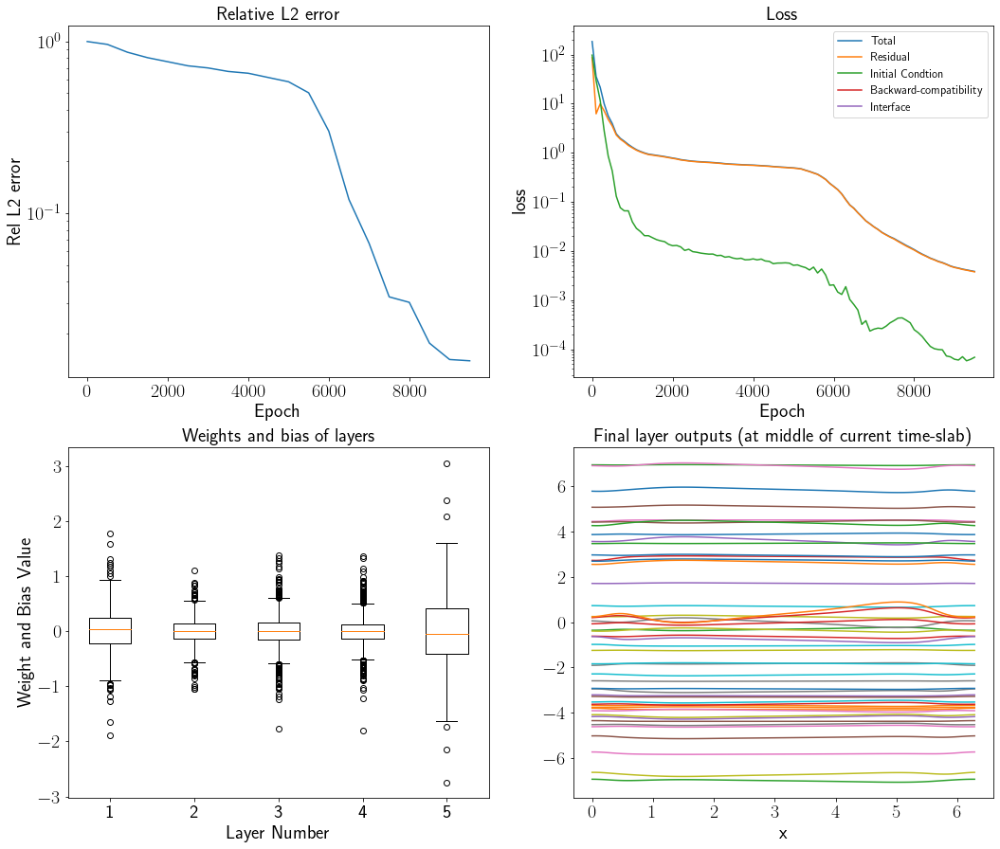

L2-error:  0.013828389723779264
Train L-BFGS:
epoch 100, loss: 0.0036808, delta loss: 1.08313e-06
epoch 200, loss: 0.00356428, delta loss: 1.21095e-06
epoch 300, loss: 0.00343494, delta loss: 1.07591e-06
epoch 400, loss: 0.00331338, delta loss: 1.01514e-06
epoch 500, loss: 0.00319208, delta loss: 1.31433e-06
Training time: 711.0097


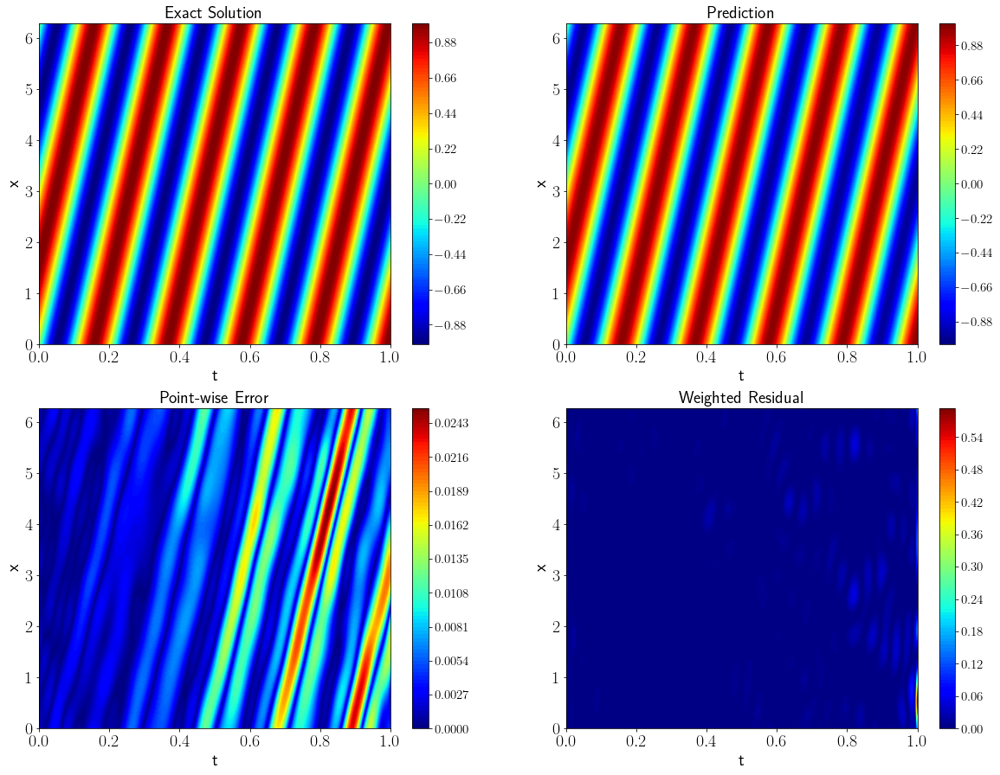

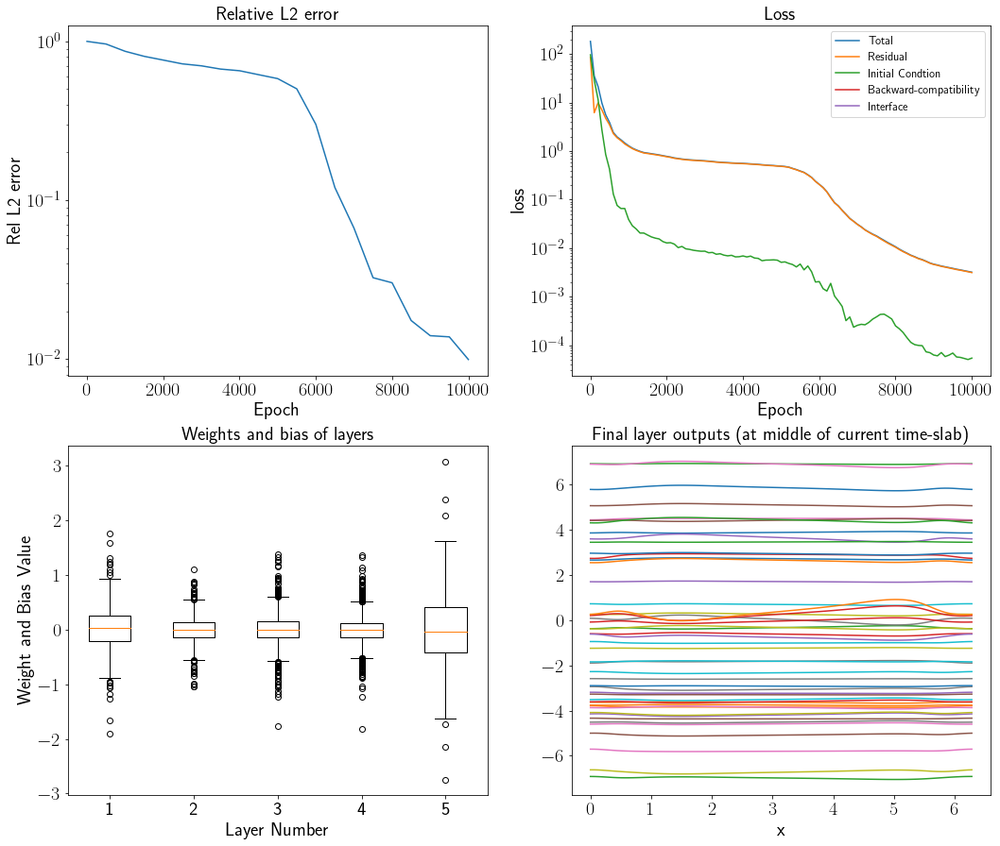

L2-error:  0.009959352288607658
Train L-BFGS:
epoch 100, loss: 0.00305828, delta loss: 1.25705e-06
epoch 200, loss: 0.00293393, delta loss: 1.67312e-06
epoch 300, loss: 0.00282082, delta loss: 1.15577e-06
epoch 400, loss: 0.00271555, delta loss: 6.9919e-07
epoch 500, loss: 0.00261131, delta loss: 1.05775e-06
Training time: 746.3899


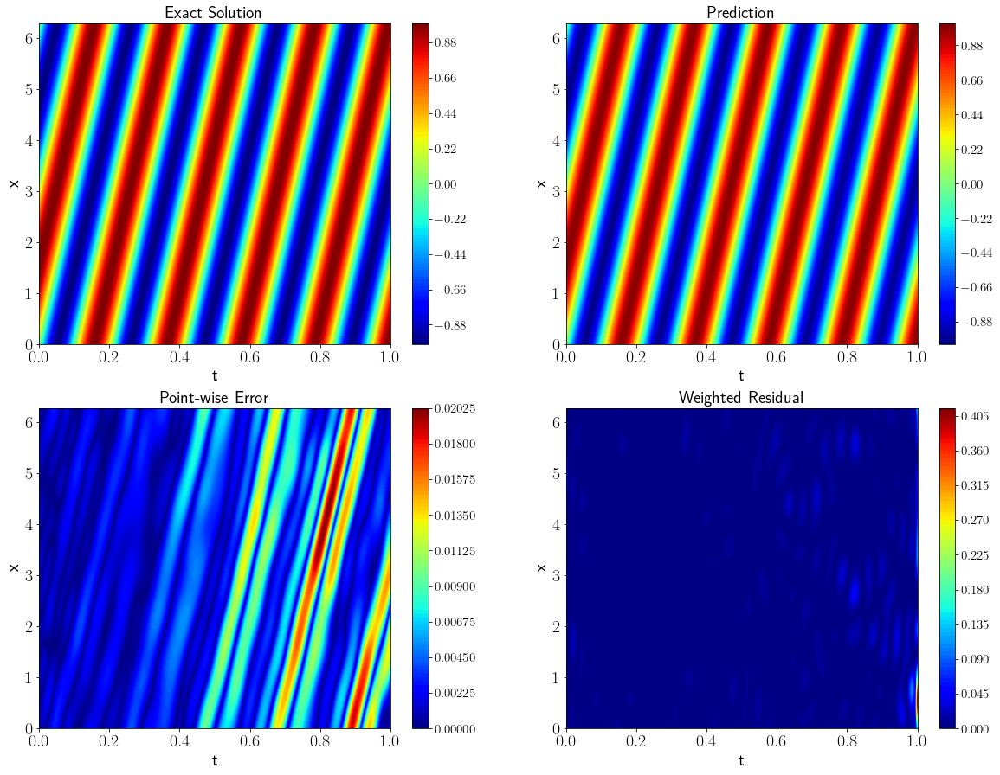

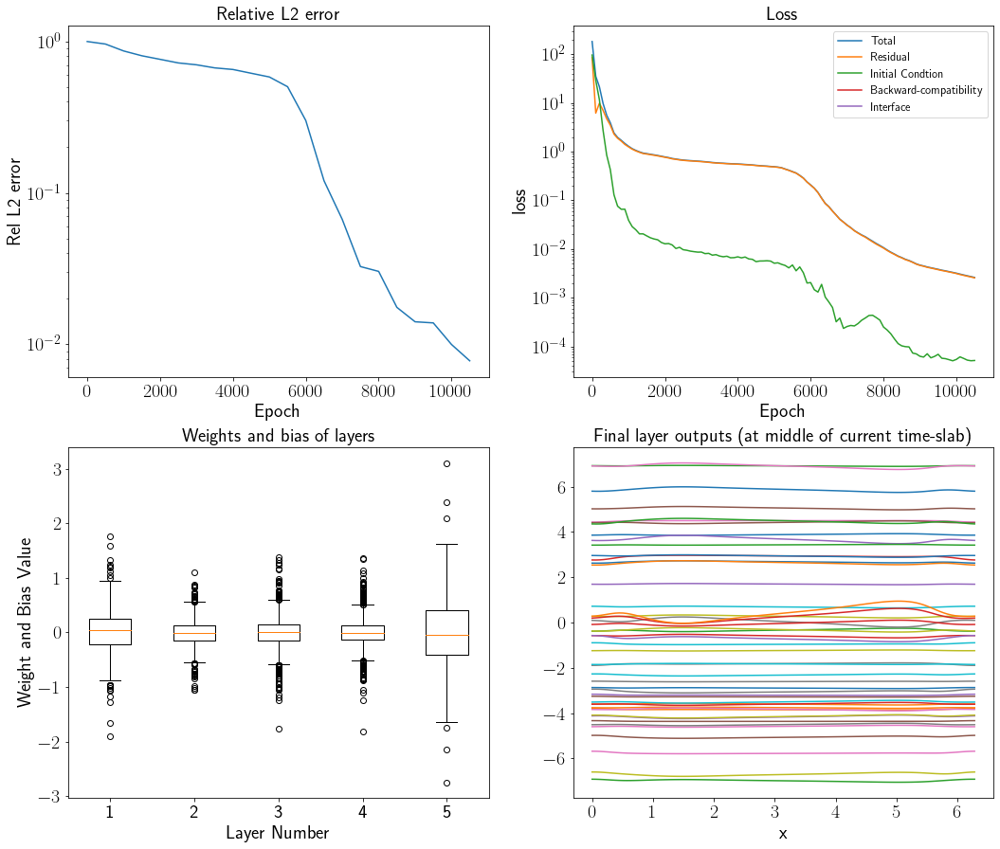

L2-error:  0.007769583349525135
Train L-BFGS:
epoch 100, loss: 0.00251263, delta loss: 1.10897e-06
epoch 200, loss: 0.00238148, delta loss: 8.801e-07
epoch 300, loss: 0.00228714, delta loss: 6.638e-07
epoch 400, loss: 0.002196, delta loss: 7.73231e-07
epoch 500, loss: 0.00211183, delta loss: 8.0117e-07
Training time: 781.3493


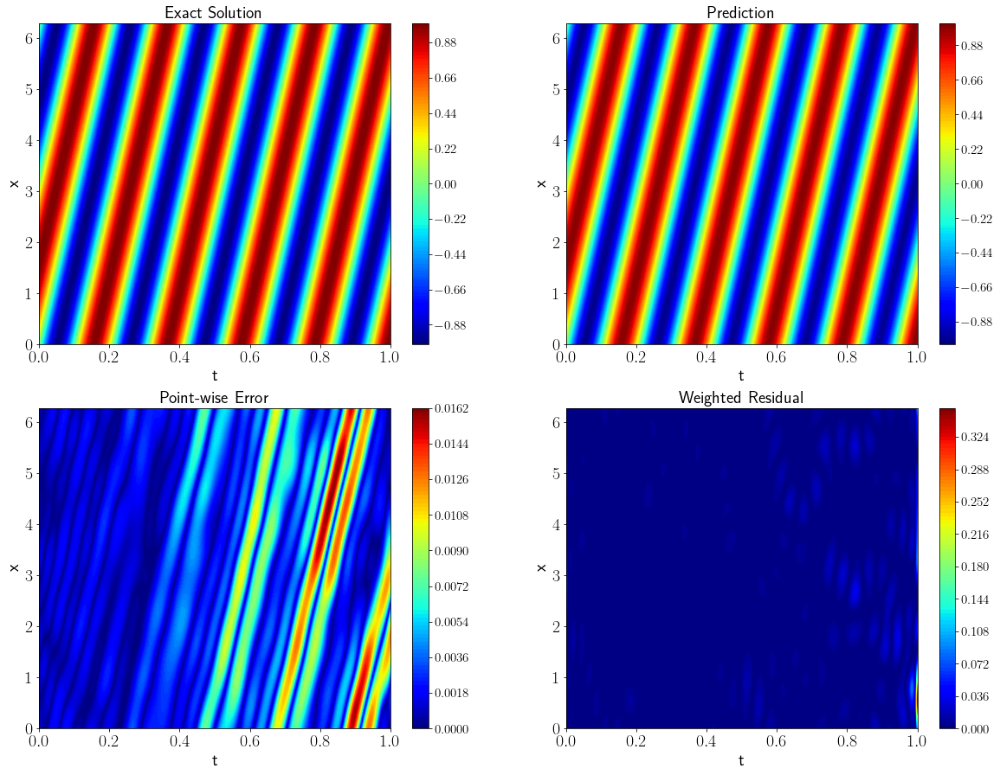

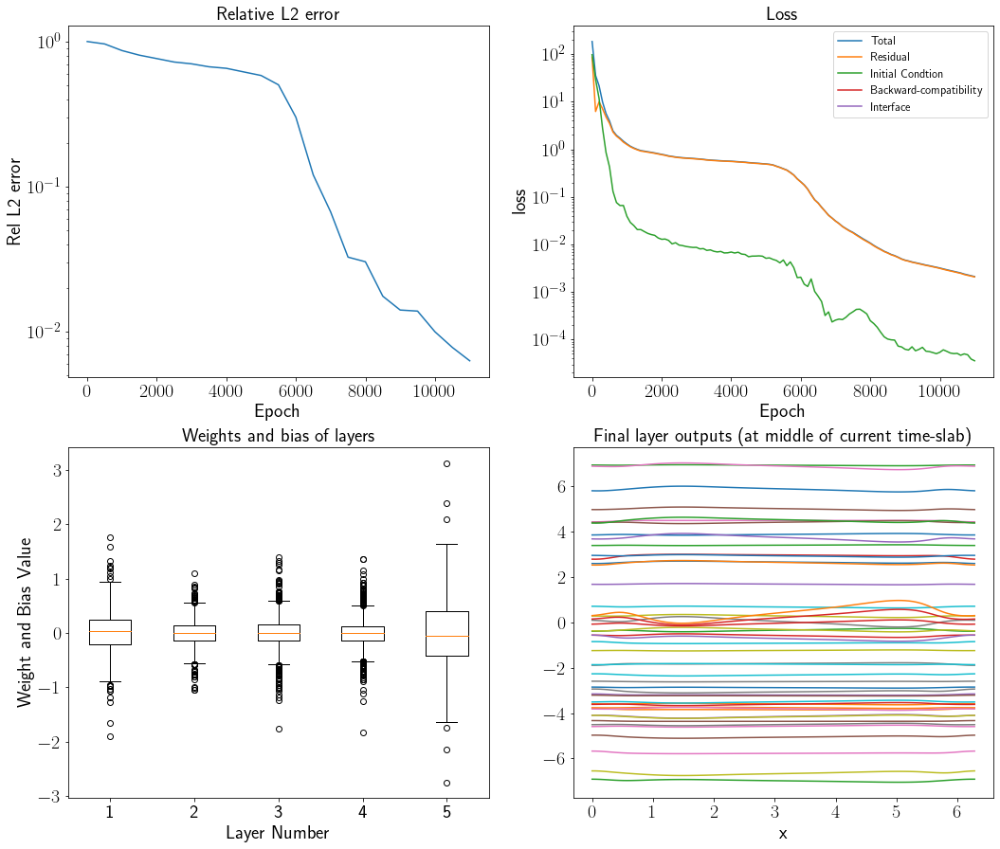

L2-error:  0.0062807502239159265
Train L-BFGS:
epoch 100, loss: 0.00203944, delta loss: 7.45524e-07
epoch 200, loss: 0.00196576, delta loss: 6.71716e-07
epoch 300, loss: 0.00190431, delta loss: 4.98956e-07
epoch 400, loss: 0.00185008, delta loss: 4.79515e-07
epoch 500, loss: 0.00177128, delta loss: 7.27363e-07
Training time: 816.3277


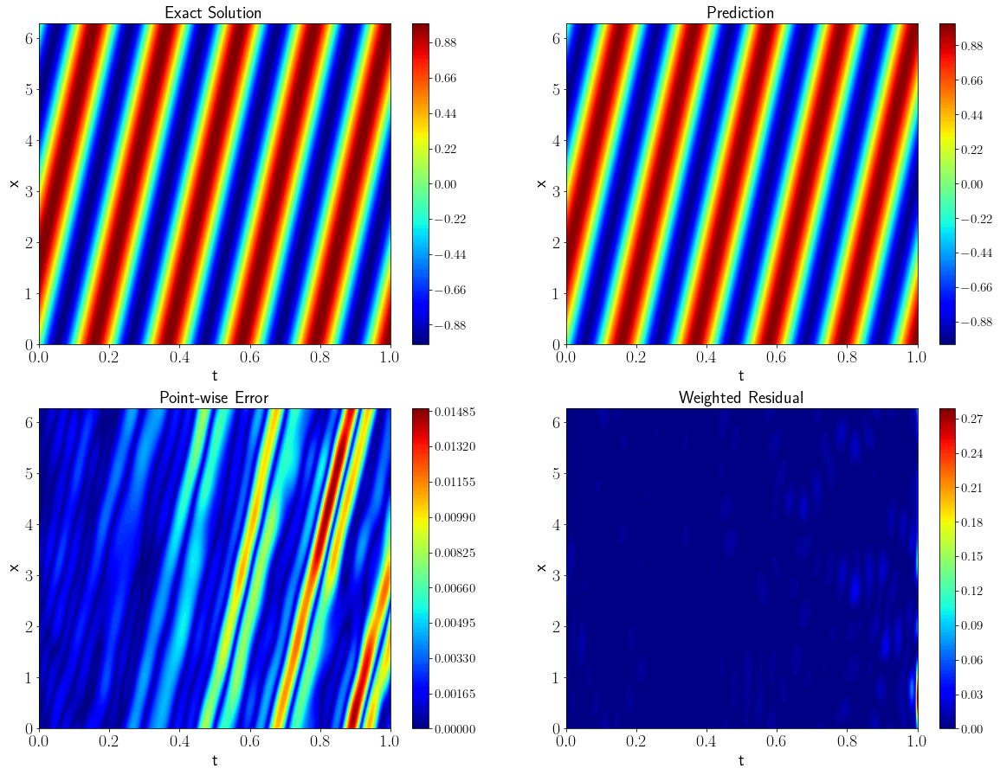

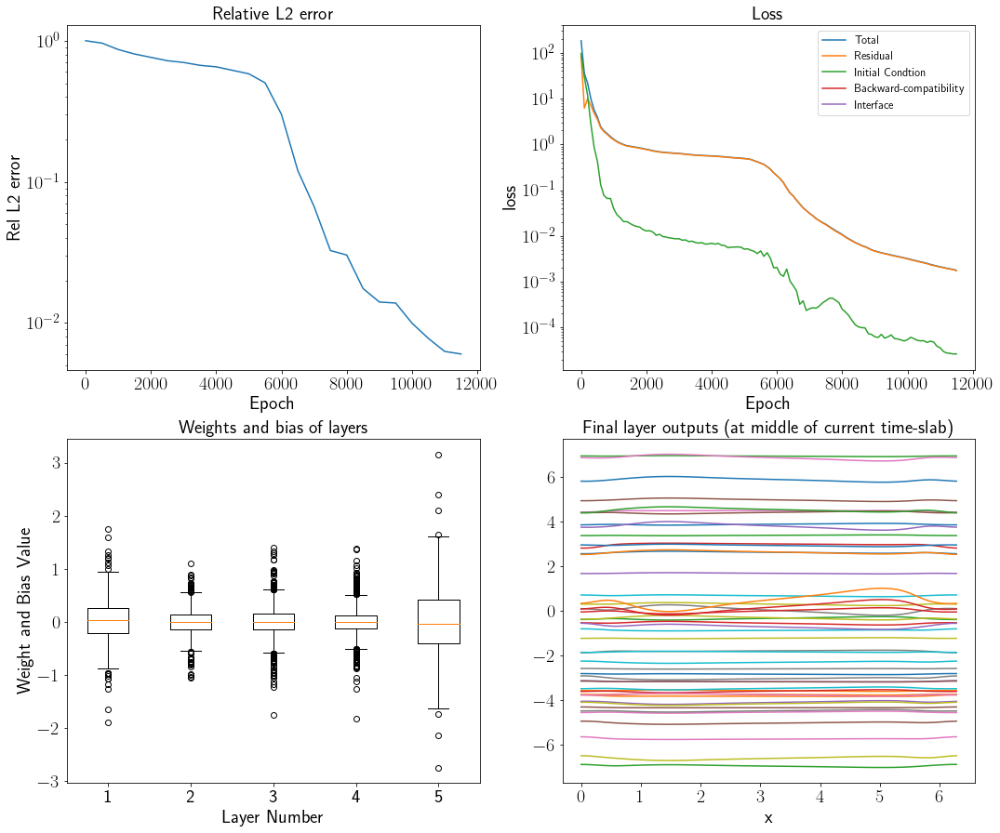

L2-error:  0.006022169911178243
Train L-BFGS:
epoch 100, loss: 0.00169686, delta loss: 7.69505e-07
epoch 200, loss: 0.00163635, delta loss: 3.58443e-07
epoch 300, loss: 0.0015815, delta loss: 4.0303e-07
epoch 400, loss: 0.00154132, delta loss: 2.31201e-07
epoch 500, loss: 0.00149722, delta loss: 5.45871e-07
Training time: 852.4613


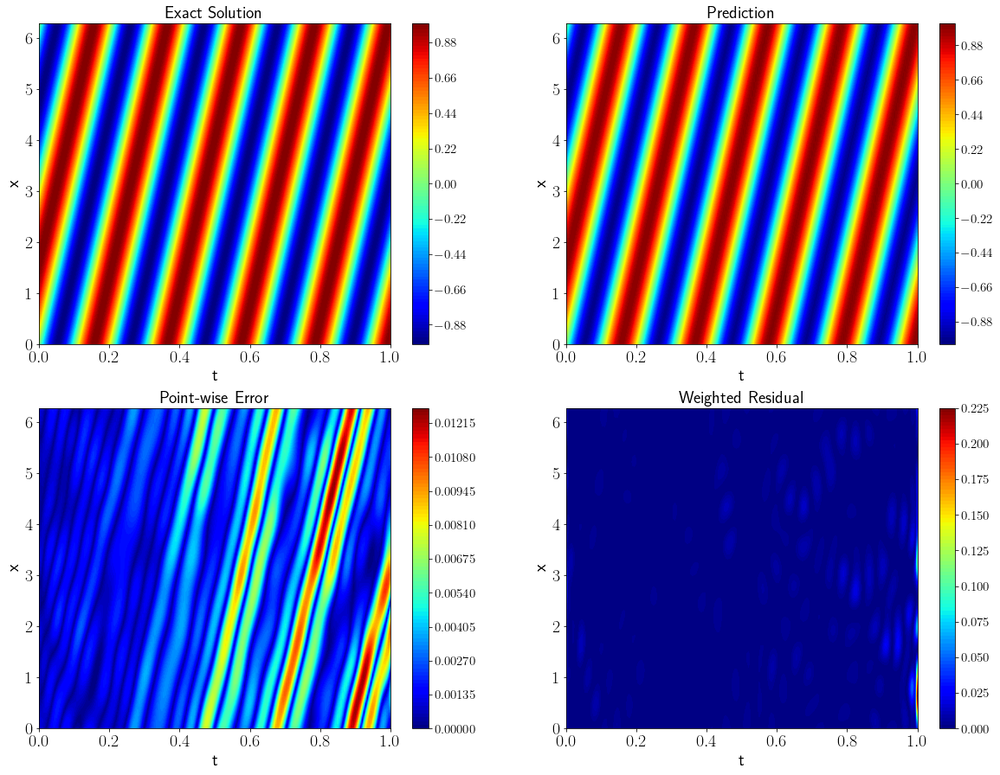

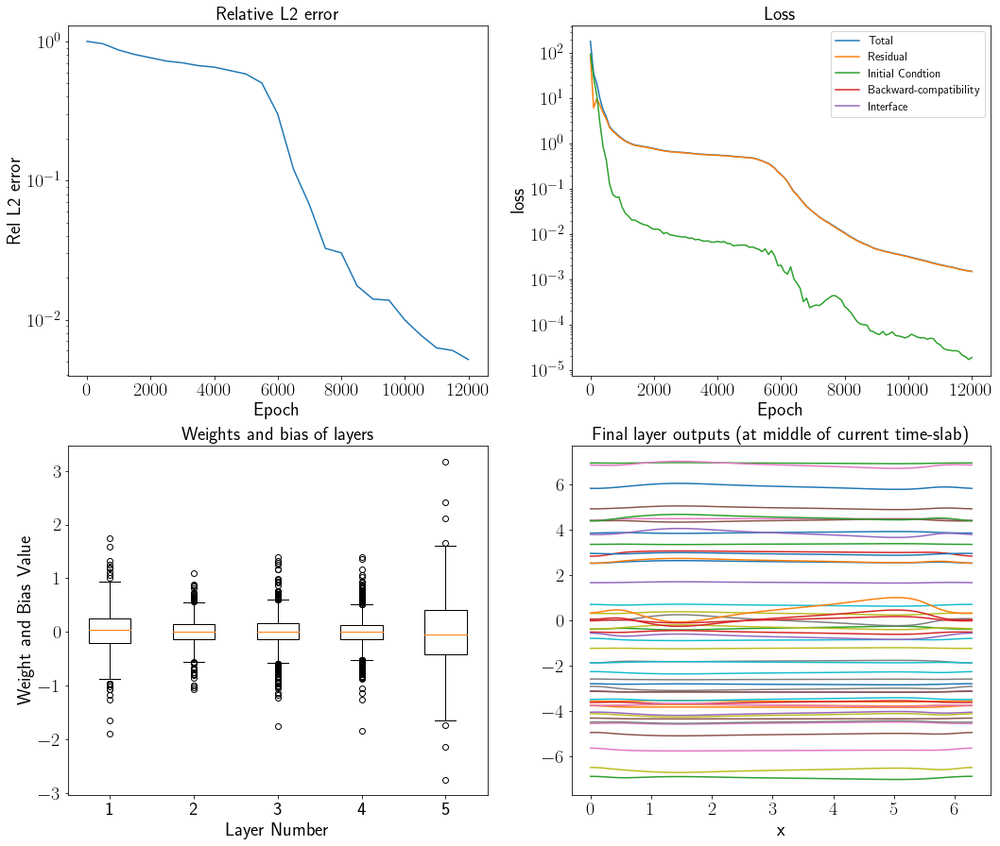

L2-error:  0.005180923961826506
Train L-BFGS:
epoch 100, loss: 0.00144558, delta loss: 1.07149e-06
epoch 200, loss: 0.00139921, delta loss: 3.85335e-07
epoch 300, loss: 0.00136743, delta loss: 3.21539e-07
epoch 400, loss: 0.0013277, delta loss: 4.29223e-07
epoch 500, loss: 0.00129731, delta loss: 4.91273e-07
Training time: 888.8818


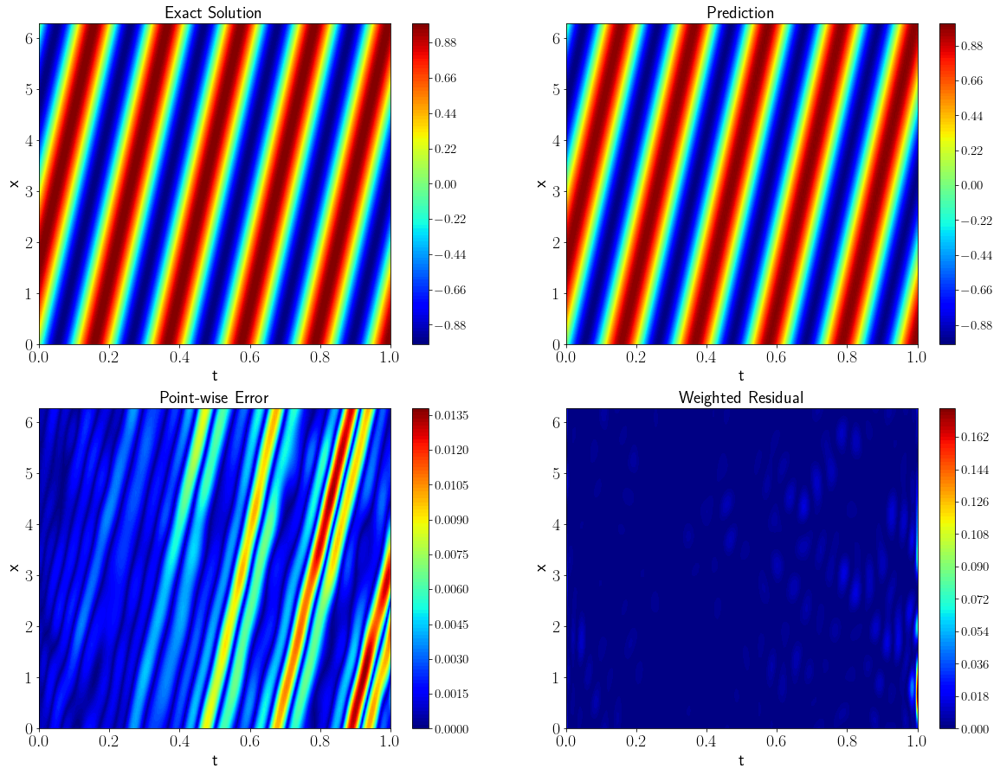

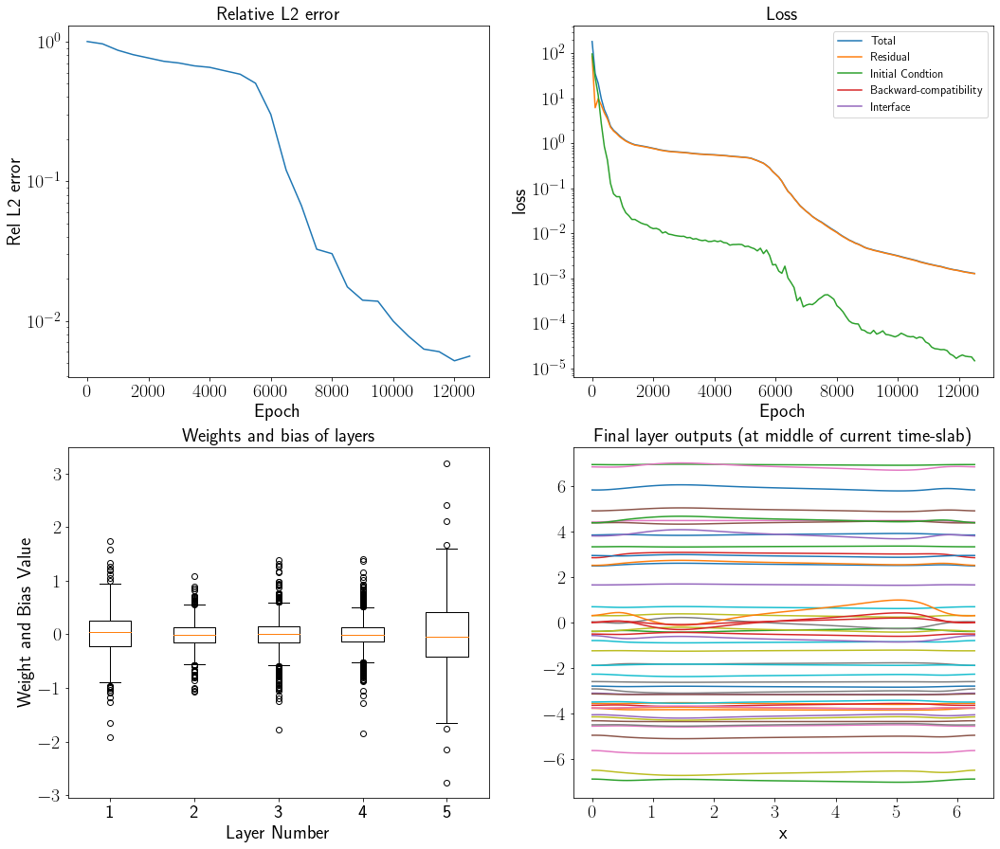

L2-error:  0.005593856362155452
Train L-BFGS:
epoch 100, loss: 0.00125755, delta loss: 6.27129e-07
epoch 200, loss: 0.00121886, delta loss: 3.11877e-07
epoch 300, loss: 0.00119439, delta loss: 2.88244e-07
epoch 400, loss: 0.00116584, delta loss: 2.27476e-07

End Condition

Training time: 922.3665


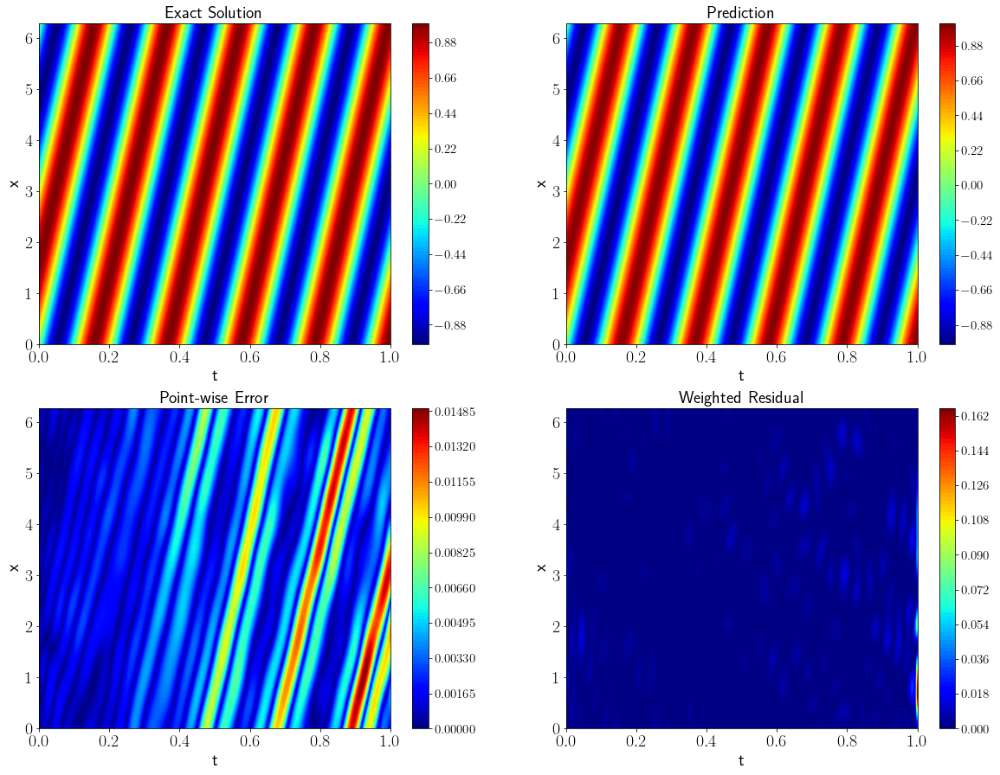

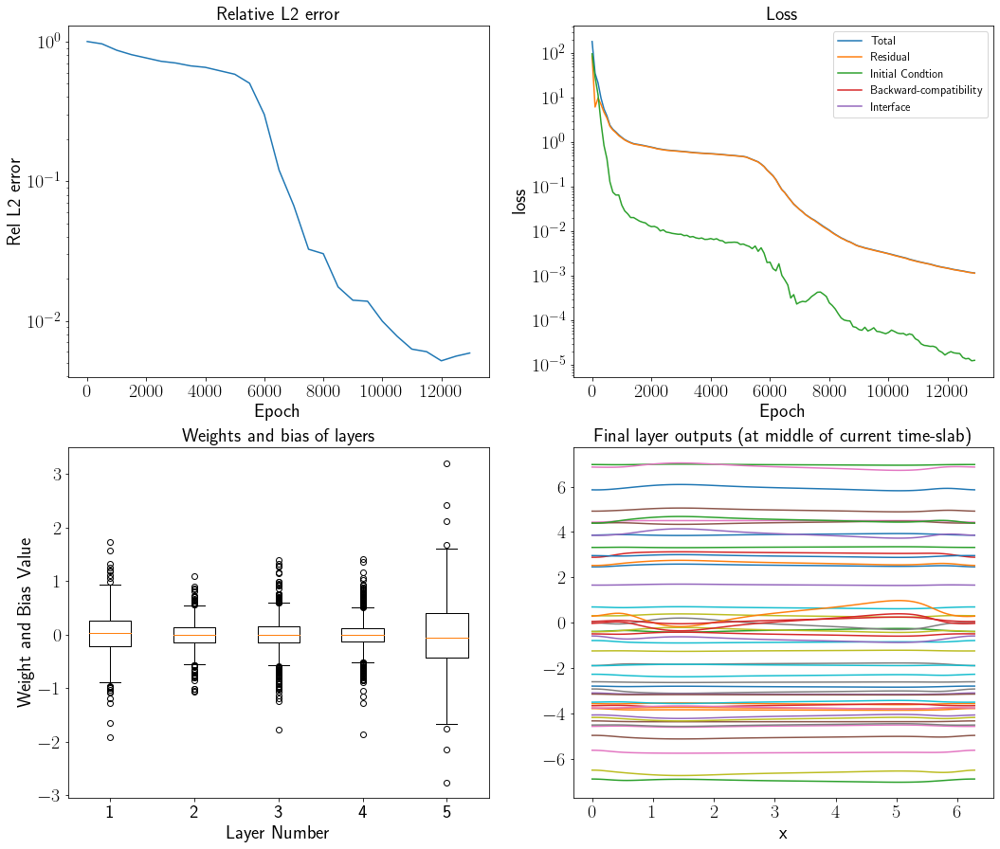

L2-error:  0.005887945124111948


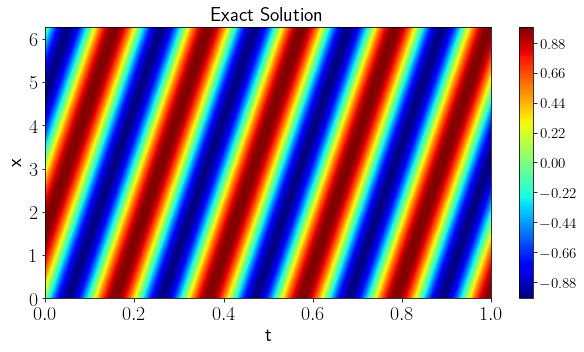

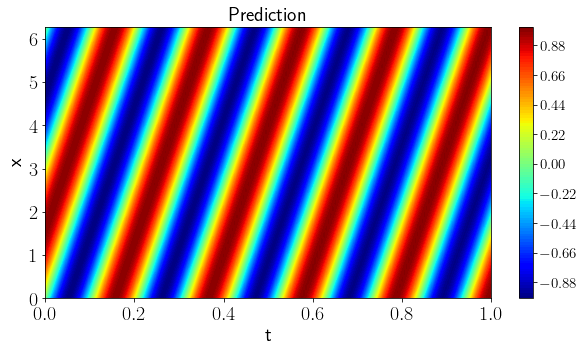

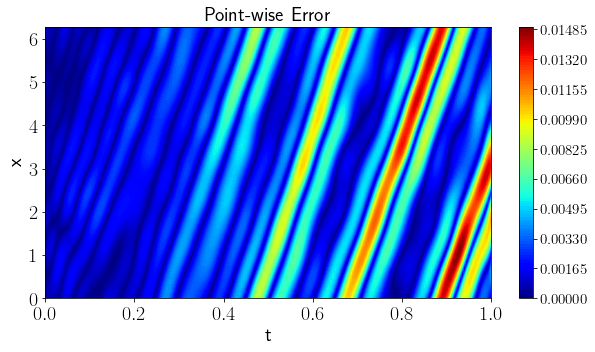

102912
102912


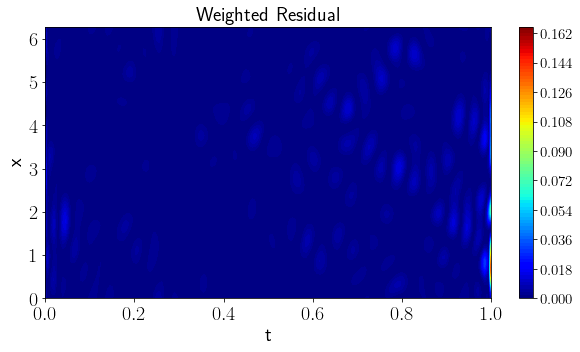

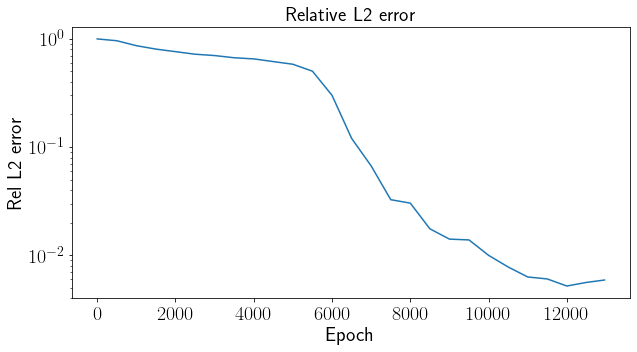

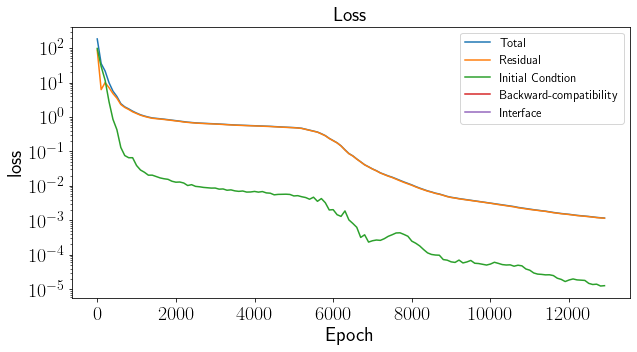

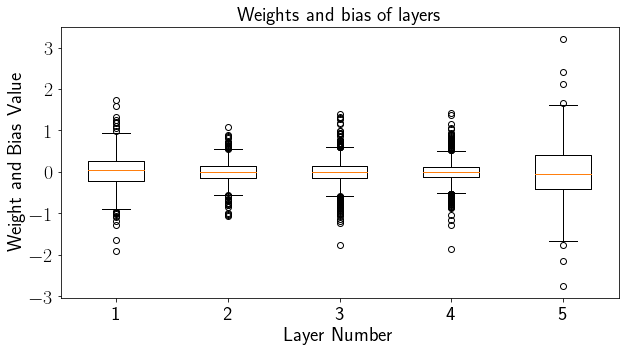

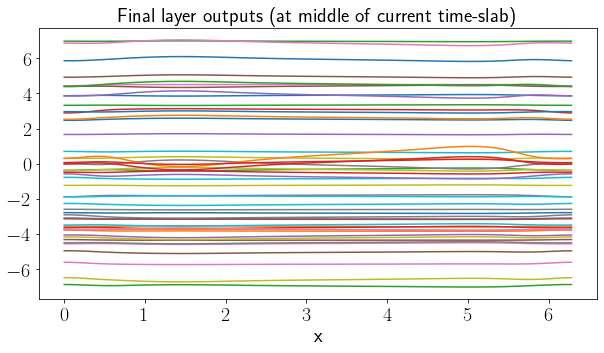

L2-error:  0.005887945124111948


In [7]:
adam_loops = 1
lbfgs_loops = 100
model = training_loop(userPar, dataPar, model, adam_loops, lbfgs_loops)